# Проект: Исследование рынка заведений <br>общественного питания Москвы.

# Описание проекта.

<font size="3">Исследование рынка заведений общественного питания в Москвы и подготовка презентации для фонда «Shut Up and Take My Money» на основе данных сервисов Яндекс Карты и Яндекс Бизнес по состоянию на лето 2022 года и подготовка презентации с рекомендациями по открытию кофейни.</font>

# Вывод.

---

**Загрузка данных.**

Таблица с данными имеет 8 406 записей в 15  столбцах - 15 параметров для 8 406 заведений. Дубликатов нет. Содержит данные по 9 административным округам:
* Северный
* Северо-Восточный
* Северо-Западный
* Западный
* Центральный
* Восточный
* Юго-Восточный
* Южный
* Юго-Западный

Заведения разбиты на 4 ценовые категории:
* выше среднего
* средние 
* высокие 
* низкие

и 8 типов:
* кафе 
* ресторан 
* кофейня 
* пиццерия 
* бар,паб
* быстрое питание 
* булочная 
* столовая

Всего используется 3 типа данных:
* `object`
* `float64`
* `int64`

Дополнительно загружены данные с расстояниями от центра города до объекта - `'distance'`.

Расстояния (удаление от центра) сохранены в формате `float64`, поправим это на этапе предобработки.

Типы данных в остальных столбцах используются корректные, преобразование не нужно.

Данные по количеству мест, среднему чеку, расписанию работы содержат значительное количество пропусков. Заполнить синтетическими данными нельзя.

Обратим внимание на максимальное значение стоимости чашки кофе - 1568, явный выброс, и минимальные значения среднего чека и количества мест - тоже выброс. Обработаем их на этапе предобработки. 

Согласно <a href="https://rosstat.gov.ru/storage/mediabank/retail_catering_2023.xlsx">данным Росстата</a>, количество заведений общественного питания в Москве по состоянию на 01 июля 2022 года составило 15 649 (2 581 столовых, закусочных и 13 068 ресторанов, кафе, баров), не считая столовые, находящиеся на балансе учебных заведений, организаций, промышленных предприятий.

Таким образом, мы располагаем информацией о 53.7% существующих заведений, но эти данные более подробные - содержат информацию о названии, адресе, географическом расположении. Для многих присутствует дополнительная информация о режиме работы, среднем чеке.

---

**Предобработка данных.**

Были добавлены 2 столбца:
* `street` - с названием улицы
* `is_24/7` - содержаший `True` для тех заведений, по котороым есть данные, что они ежедневно и круглосуточно работают, и `False` для всех остальных.

В столбцах, содержащих информацию о среднем чеке и количестве мест нулевые значения заменены на `nan`.

Преведена фильтрация данных по 2 параметрам - среднему чеку и вместимости.

Откорректирован выброс `'стоимость чашки капучино'` = 1,568.00, новое значение - 260.00.

Установлены предельные значения:
* для среднего чека - 5000
* для вместимости - 300

Выбросы удалены.
Нулевые значения заменены на `np.nan`

После предобработки осталось 96,8% данных - показатель в норме.

---

**Анализ данных.**

Самые популярные по категориям - это кафе, затем рестораны и кофейни.

Самые вместительные - это рестораны и бары/пабы, самые маленькие - кафе и пиццерии. Основной объем продаж типичной пиццерии - это доставка. Так что тут все логично.

Доля сетевых заведений составляет 38%.
Доля сетевых заведений больше несетевых в 3 категориях:
* кофейни
* пиццерии
* булочные

Наибольшие доли сетевых заведений в категориях:
* булочная - 61.1% 
* пиццерия - 52.1% 
* кофейня - 50.5%

Наименьшие:
* бар,паб - 22.8% 
* столовая - 27.9% 
* кафе - 32.6%.

В ТОП15 сетевых заведений попали:
* 'Шоколадница',
*  "Домино'с Пицца",
*  'Додо Пицца',
*  'One Price Coffee',
*  'Яндекс Лавка',
*  'Cofix',
*  'Prime',
*  'Хинкальная',
*  'КОФЕПОРТ',
*  'Кулинарная лавка братьев Караваевых',
*  'Теремок',
* 'Чайхана',
*  'CofeFest',
*  'Буханка',
*  'Му-Му'

Среди них категорий:
1. Бар, паб
2. Столовая
<br>не встречается вообще.

Распределение среди ТОП15 сетей выглядит следующим образом:
<table border="1" class="dataframe">  <thead>    <tr style="text-align: right;">      <th></th>      <th>qty</th>      <th>units</th>    </tr>    <tr>      <th>category</th>      <th></th>      <th></th>    </tr>  </thead>  <tbody>    <tr>      <th>кофейня</th>      <td>5</td>      <td>318</td>    </tr>    <tr>      <th>кафе</th>      <td>3</td>      <td>99</td>    </tr>    <tr>      <th>ресторан</th>      <td>3</td>      <td>151</td>    </tr>    <tr>      <th>пиццерия</th>      <td>2</td>      <td>148</td>    </tr>    <tr>      <th>булочная</th>      <td>1</td>      <td>32</td>    </tr>    <tr>      <th>быстрое питание</th>      <td>1</td>      <td>44</td>    </tr>  </tbody></table>

У нас имеются данные по 9 административным округам:
* Северный
* Северо-Восточный
* Северо-Западный
* Западный
* Центральный
* Восточный
* Юго-Восточный
* Южный
* Юго-Западный

Центральный округ в топе по количеству заведений, а по количеству баров, ресторанов и кофеен он в разы больше, чем любой из остальных округов. Остальные типы заведений распределены более равномерно.

Наиболее часто встречающийся рейтинг - от 4.0 до 4.5.

Наивысший рейтинг - у баров,пабов, низший - у заведений быстрого питания.

Похоже, что нельзя напрямую сравнивать рейтинги заведений различных категорий - в бар идут с хорошим настроением, + алкоголь, отсюда и высокие рейтинги. Для быстрого питания ситуация другая - человек стремится как можно быстрее перекусить, весь в делах, а тут очередь, нет свободных мест, как результат страдает рейтинг. Для пиццерии, учитывая специфику, весомую роль может играть скорость доставки, что не характерно для других категорий. Профиль клиента по категориям тоже различается.

Можно предположить, что для каждой из категорий рейтинг складывается из разных параметров с разным весом и общего у них только слово "рейтинг". Сравнивать имеет смысл только внутри категории.

Самые рейтинговые округа:
* Центральный - 4.38
* Северный - 4.24
* Северо-Западный - 4.21

ТОП15 улиц по количеству заведений:

<table border="1" class="dataframe">  <thead>    <tr style="text-align: right;">      <th></th>      <th>qty</th>    </tr>    <tr>      <th>street</th>      <th></th>    </tr>  </thead>  <tbody>    <tr>      <th>проспект Мира</th>      <td>183</td>    </tr>    <tr>      <th>Профсоюзная улица</th>      <td>122</td>    </tr>    <tr>      <th>Ленинский проспект</th>      <td>101</td>    </tr>    <tr>      <th>проспект Вернадского</th>      <td>97</td>    </tr>    <tr>      <th>Варшавское шоссе</th>      <td>73</td>    </tr>    <tr>      <th>Ленинградский проспект</th>      <td>72</td>    </tr>    <tr>      <th>Дмитровское шоссе</th>      <td>70</td>    </tr>    <tr>      <th>Ленинградское шоссе</th>      <td>70</td>    </tr>    <tr>      <th>Каширское шоссе</th>      <td>66</td>    </tr>    <tr>      <th>МКАД</th>      <td>65</td>    </tr>    <tr>      <th>Люблинская улица</th>      <td>60</td>    </tr>    <tr>      <th>Кутузовский проспект</th>      <td>53</td>    </tr>    <tr>      <th>улица Миклухо-Маклая</th>      <td>47</td>    </tr>    <tr>      <th>Алтуфьевское шоссе</th>      <td>44</td>    </tr>    <tr>      <th>проспект Андропова</th>      <td>42</td>    </tr>  </tbody></table>

В список, что очевидно, попали самые длинные улицы Москвы (МКАД тоже будем считать улицей). Взаимосвязи между длиной и количеством заведений нет. Самая длинная классическая улица - Профсоюзная - на втором месте, МКАД (самая длинная) - на десятом.

Лидер - Проспект Мира, на нем присутствуют все 8 категорий.

Выделяется МКАД - баров практически нет (основной траффик - автомобильный) и больше половины это кафе. Очень вероятно, что если сравнить структуру распределения на МКАД и в ТЦ, то они будут практически идентичны, отделностоящие здания на МКАД - это большая редкость, в основном ТЦ.

Улицы, на которых находится только один объект общепита.

458 улиц = 458 заведений. Это улицы с наименьшей проходимостью, короткие, тупиковые, промзоны - там мало людей. В рамках нашего исследования интереса не представляют.

ТОП3 категорий:
* кафе
* ресторан
* кофейня

сотавляют 73.6% всех заведений.

В рамках исследования  между медианными значениями среднего чека для каждого района прямой зависимости между удалённостью от центра и средним чеком не выявлено.

Самые дорогие - Центральный и Западный округа. Внутри округа прослеживается нелинейная зависимость среднего чека от удаления от центра.

После добавления данных об удаленности заведения от центра и данных Мосстата о площади административных округов стало возможным проделать дополнительный анализ.

Мы выяснили, что Центральный округ имеет наибольшую плотность заведений. 

Сюрприз от Западного округа - наименьшая плотность. Но, если взглянуть на карту, видно, что большАя часть округа приходится на его часть за МКАД, по которой данных нет. А гистограмма и расчет нам это подтверждают, основное распределение находится в пределах до 14.3 км от центра (95% всех заведений округа).

---

**Детализирование исследования.**

Всего кофеен по нашим данным: 1373
<br>Доля кофеен: 16.9 %

По количеству кофеен лидируют Центральный, Северный и Северо-Восточный округа. По доле лидер Северный округ.

По удалению кофеен от центра самое неравномерное распределение в Центральном округе - кофейни жмутся к третьему километру от центра. По остальным округам распределение более равномерное.

Мы располагаем данными о 58 круглосуточных кофейнях, 25 из которых - это 43% -  находятся в Центральном округе.

Полученные данные подтверждают гипотезу о том, что круглосуточный режим работы - сомнительное преимущество для кофейни (меньше 5% с таким режимом работы). Также желательно посетить их и посмотреть на меню, возможно, там есть алкогольные напитки и/или кальян и, значит, это не совсем кофейни.

Средняя стоимость чашки капучино - 173 руб.

Западный округ - самый дорогой. Притом, что рейтинг у него самый низкий. Центральный лишь на втором месте.

3 из 9 округов имеют среднюю стоимость чашки капучино значение больше среднего по городу:
* Западный округ
* Центральный округ
* Юго-Западный округ

Самый дорогой кофе - 375 руб. за чашку - у заведения с рейтингом 4.3. У заведений с высокими рейтингами (4.6 и 4.8) стоимость 300 руб.

Максимальная стоимость чашки у заведений с топовым рейтингом - 245 руб.

Максимальная стоимость чашки в Центральном округе - 328 руб (рейтинг заведения 4.3).
<br>Максимальная стоимость чашки у топовых заведений Центрального округа - 160 руб.

Максимальная стоимость чашки в Западном округе - 300 руб (рейтинг заведения 4.2).
<br>Максимальная стоимость чашки у топового заведения (рейтинг 4.8) Западного округа - 270 руб.

Мы увидели, что максимальная стоимость чашки капучино значительно выше, чем в топовых заведениях. Это говорит о том, что полностью удовлетворить клентов при высокой стоимости чашки невозможно - требования начинают расти вместе с ростом стоимости.

Максимальная стоимость чашки капучино для заведений с высоким рейтингом (4.8 и 4.6) составляет 300 руб. Видимо, это та отметка, которую клиенты готовы платить и оставаться на высоком уровне удовлетворенности.

---

**Рекомендации.**

"Круто и доступно" - наш девиз.

**Круто.**

Начнем с крутости - крутым заведение будет при большом траффике. Отзывы, фото в соцсетях, события в лентах новостей - без траффика тут не обойтись. Наивысшая проходимость - значит Центральный округ. 

Конкурентное окружение - 19.3% кофеен от общего числа заведений общественного питания. Второй по насыщенности среди московских округов.

Мы выяснили, что располагаем детальной информацией о 53.7% существующих заведений (сверившись с Росстатом) - поэтому не можем опираться на карту с детальными данными - это всего лишь чуть больше половины всех заведений. Предлагается рассмотривать точки внутри Садового кольца - мы будем иметь максимальный траффик и не доходим до зоны максимальной плотности кофеен в Центральном округе - удаления в 3 км от центра (радиус Садового кольца не превышает 1.5 км). Внимание надо обратить на улицы с высоким траффиком - Тверскую, улицы Садового кольца, район Цветного бульвара.

Следствие топового расположения - высокая аренда, очень вероятен договор не с фиксированной ставкой, а с минимальной ставкой + концессионные отчисления, что полностью исключает понятие "дешево". Но "дешево" редко бывает круто, так что такой вариант нам подходит.

**Доступно.**

Кофейни не относятся к типу заведений с экстремальными ценами, потратить несколько сотен рублей может практически каждый, особенно если это круто, престижно, модно. Поэтому мы остаемся в категории "доступно" даже если будем придерживаться верхнего уровня относительно категории заведения цен.

Для поддержания "крутости" необходим рейтинг. Но и забыть про условия аренды мы тоже не можем - экономика. 

Мы имеем:
* необходимость получения высокого рейтинга ограничивает нас сверху по ценам
* условия аренды в топовых местах давят на нашу ценовую политику снизу, толкая цены вверх.

Мы выяснили точку схождения этих двух встречнонаправленных векторов: максимальная стоимость чашки капучино у заведений с высоким рейтингом составляет 300 руб. - это наш ориентир.

При этом не надо стремиться к получению максимального рейтинга, он напрямую связан с относительно невысокими ценами, наш ориентир для Центрального округа - 4.7 и выше.

Среднее количество мест в кофейне Центрального округа - чуть меньше 100. Значит, это тоже наш ориентир - 100 и более гостей.

**Итак, мы сформировали образ нашей кофейни:
<br>Крутое, престижное, модное заведение формата "Lounge" с ценой чашки капучино 300 руб., готовое принять 100 и более гостей, рейтингом 4.7 и выше и расположением внутри Садового кольца.**

**Круто, Престижно и Модно - три кита нашего проекта.**

Каждое решение дизайн-проекта должно содержать в себе "круто", "престижно" или "модно", при этом избегая концепции "богато" - эти 4 термина практически невозможно совместить все одновременно. Не забываем о гармонии.

Все элементы, не только дизайн, но и формат обслуживания, внешний вид персонала должны соответствовать нашим трем китам.

# План работы.

**Этап 1. Загрузка данных и определение функций.**

* Подключить необходимые библиотеки.
* Определить необходимые функции.
* Загрузить данные о заведениях общественного питания Москвы.

Изучить общую информацию о датасете. 

Ответить на вопросы:
* Сколько заведений представлено? 
* Что можно сказать о каждом столбце? 
* Значения какого типа они хранят? 

**Этап 2. Предобработка данных.**

Ответить на вопросы:
* Есть ли дубликаты в данных? 
* Встречаются ли пропуски, в каких столбцах? 
* Можно ли их обработать или оставить как есть?

Выполнить предобработку данных:
* Создайть столбец street с названиями улиц из столбца с адресом.
* Создайть столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
    - логическое значение True — если заведение работает ежедневно и круглосуточно;
    - логическое значение False — в противоположном случае.

**Этап 3. Анализ данных.**

* Какие категории заведений представлены в данных? Исследовать количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответить на вопрос о распределении заведений по категориям.
* Исследуовать количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализировать результаты и написать выводы.
* Рассмотреть и изобразить соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?
* Какие категории заведений чаще являются сетевыми? Исследовать данные и ответить на вопрос - построить график.
* Сгруппировать данные по названиям заведений и найти топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постротиь подходящую для такой информации визуализацию. Знакомы ли эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?
* Какие административные районы Москвы присутствуют в датасете? Отобразить общее количество заведений и количество заведений каждой категории по районам. Попробовать проиллюстрировать эту информацию одним графиком.
* Визуализировать распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?
* Построить фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).
* Отобразить все заведения датасета на карте с помощью кластеров средствами библиотеки folium.
* Найти топ-15 улиц по количеству заведений. Построить график распределения количества заведений и их категорий по этим улицам. Проиллюстрировать эту информацию одним графиком.
* Найти улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?
* Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитать медиану этого столбца для каждого района. Использовать это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?
* Необязательно: проиллюстрировать другие взаимосвязи, которые обнаружены в данных. Например, часы работы заведений и их зависимость от расположения и категории заведения. Исследовать особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений.
* На основе наблюдений по пунктам выше написать один общий вывод.

**Этап 4. Детализирование исследования: открытие кофейни.**

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

Ответьте на следующие вопросы:
* Сколько всего кофеен в датасете? 
* В каких районах их больше всего, каковы особенности их расположения?
* Есть ли круглосуточные кофейни?
* Какие у кофеен рейтинги? 
* Как они распределяются по районам?
* На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

Можно расширить список вопросов для исследования, добавив собственные.

Построить визуализации. Дать рекомендации для открытия нового заведения. Это творческое задание: здесь нет правильного или неправильного ответа, но ваше решение должно быть чем-то обосновано. Объяснить свою рекомендацию можно текстом с описанием или маркерами на географической карте.

# Выполнение проекта.

## Этап 1. Загрузка данных и определение функций.

### Импорт библиотек.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import json

import requests
from urllib.parse import urlencode

from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster

### Определение необходимых функций.

In [2]:
# Стандартные проверки датафрейма и общая информация
def df_info(df):
    display(df.head())
    print('*'*40, '\n')
    print('Общая информация:')
    display(df.info())
    print('*'*40, '\n')
    print('Проверка на пропуски:')
    display(df.isna().sum())
    print('*'*40, '\n')
    print('Проверка на дубликаты:')
    display(df.duplicated().sum())
    print('*'*40, '\n')
    print('Уникальные значения в столбцах:')
    display(df.nunique())
    print('*'*40, '\n')
    display(df.describe())

In [3]:
# функция, которая принимает строку датафрейма,
# создаёт маркер с именем и рейтингом заведения в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

### Загрузка данных.

In [4]:
# загрузка исходных данных
try :
    food_df = pd.read_csv('/datasets/moscow_places.csv', sep=',')
    state_geo = '/datasets/admin_level_geomap.geojson'
    # флаг необходм для исправления разных подходов в названии столбцов для разных версий библиотек
    local_flag = False
    print('Данные загружены из каталога Yandex Practicum.')

except :
    food_df = pd.read_csv('res/moscow_places.csv', sep=',')
    # для локального файла необходимо явное указание кодировки, иначе при создании хороплета соответсвий не будет
    with open('res/admin_level_geomap.geojson', 'r', encoding='utf-8') as f: 
        state_geo = json.load(f) 
    # флаг необходм для исправления разных подходов в названии столбцов для разных версий библиотек
    local_flag = True
    print('Данные загружены из локального каталога.')

Данные загружены из каталога Yandex Practicum.


### Установка параметров отображения.

Для всех чисел с плавающей запятой установим формат отображения на экране - 2 цифры после запятой:

In [5]:
pd.options.display.float_format = '{:,.2f}'.format

На точности вычислений это никак не скажется - формат установлен только для вывода на экран, данные в датафрейме не изменились.

### Общая информация.

In [6]:
df_info(food_df)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


**************************************** 

Общая информация:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

**************************************** 

Проверка на пропуски:


name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

**************************************** 

Проверка на дубликаты:


0

**************************************** 

Уникальные значения в столбцах:


name                 5614
category                8
address              5753
district                9
hours                1307
lat                  8209
lng                  8258
rating                 41
price                   4
avg_bill              897
middle_avg_bill       230
middle_coffee_cup      96
chain                   2
seats                 229
dtype: int64

**************************************** 



,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,"8,406.00","8,406.00","8,406.00","3,149.00",535.00,"8,406.00","4,795.00"
mean,55.75,37.61,4.23,958.05,174.72,0.38,108.42
std,0.07,0.10,0.47,"1,009.73",88.95,0.49,122.83
min,55.57,37.36,1.00,0.00,60.00,0.00,0.00
25%,55.71,37.54,4.10,375.00,124.50,0.00,40.00
50%,55.75,37.61,4.30,750.00,169.00,0.00,75.00
75%,55.80,37.66,4.40,"1,250.00",225.00,1.00,140.00
max,55.93,37.87,5.00,"35,000.00","1,568.00",1.00,"1,288.00"


Обратим внимание на максимальное значение стоимости чашки кофе - 1568, явный выброс, и минимальные значения среднего чека и количества мест - тоже выброс. Обработаем их на этапе предобработки. 

### Загрузка дополнительных данных.

**Теперь загрузим внешний файл с расстояниями от центра города до объекта.**

Файл `distance.csv` создан на основе исходного датасета `moscow_places.csv` при помощи библиотеки `geopy` и помещен на ЯндексДиск. Сам расчет интереса не представляет, это вызов функции `distance` с двумя параметрами - координатами точек, между которыми надо вычислить расстояние - `distance(origin, dist).meters` - и указанием пареметра, в каких единицах мы хотим получить результат. Применяется к столбцам `lat` и `lng` датафрейма `food_df` и точке `city_center = {'lat' : 55.751244, 'lng' : 37.618423}`, которая в нашей теории указана как центр Москвы.

Загрузка происходит на начальном этапе для того, чтобы избежать возможных искажений и несоответствий при присоединении данных после изменения основного датафрейма. Индексы, как элемент контроля, в файле `distance.csv` сохранены.

Данные о расстоянии до центра города мы будем использовать для расширенного анализа.

Можно было это сделать короче, просто загрузив и использовав библиотеку `geopy` (`pip install geopy` - тут ничего сложного), но мне показалось более интересным использовать несколько методов:
1. Подготовить файл и загрузить в сеть
2. Непосредственно в проекте загрузить данные из сетевого файла

вполне себе жизненная ситуация. Да и делаю я это впервые и весьма рад, что все получилось.

Тем более, что предустановленной библиотеки `geopy`, необходимой для создания файла `distance.csv`, в ЯндексПрактикуме нет, а библиотеки `requests` и `urllib`, необходимые для чтения удаленного файла -  есть.

In [7]:
# API Яндекса:
base_url = 'https://cloud-api.yandex.net/v1/disk/public/resources/download?'
# https-ссылка на файл:
public_key = 'https://disk.yandex.ru/d/ULXJgN2bdP6Lmg'

# Получаем загрузочную ссылку
final_url = base_url + urlencode(dict(public_key=public_key))
response = requests.get(final_url)
download_url = response.json()['href']

# читаем файл с расстояниями в датафрейм:
distance_df = pd.read_csv(download_url, index_col='index')

# добавляем столбец с расстояниями к основному датафрейму:
food_df = pd.concat([food_df, distance_df], axis=1)
food_df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,distance
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN,"16,652.00"
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00,"16,212.00"
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00,"16,413.00"
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,"16,632.00"
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00,"17,932.00"


In [8]:
food_df['distance'].describe()

count    8,406.00
mean     8,685.35
std      4,841.08
min        418.00
25%      4,253.75
50%      8,541.50
75%     12,903.00
max     20,377.00
Name: distance, dtype: float64

Расстояния сохранены в формате `float64`, поправим это на этапе предобработки.

### Вывод: загрузка данных.

Таблица с данными имеет 8 406 записей в 15  столбцах - 15 параметров для 8 406 заведений. Дубликатов нет. Содержит данные по 9 административным округам:
* Северный
* Северо-Восточный
* Северо-Западный
* Западный
* Центральный
* Восточный
* Юго-Восточный
* Южный
* Юго-Западный

Заведения разбиты на 4 ценовые категории:
* выше среднего
* средние 
* высокие 
* низкие

и 8 типов:
* кафе 
* ресторан 
* кофейня 
* пиццерия 
* бар,паб
* быстрое питание 
* булочная 
* столовая

Всего используется 3 типа данных:
* `object`
* `float64`
* `int64`

Расстояния (удаление от центра) сохранены в формате `float64`, поправим это на этапе предобработки.

Типы данных в остальных столбцах используются корректные, преобразование не нужно.

Данные по количеству мест, среднему чеку, расписанию работы содержат значительное количество пропусков. Заполнить синтетическими данными нельзя.

Обратим внимание на максимальное значение стоимости чашки кофе - 1568, явный выброс, и минимальные значения среднего чека и количества мест - тоже выброс. Обработаем их на этапе предобработки. 

Согласно <a href="https://rosstat.gov.ru/storage/mediabank/retail_catering_2023.xlsx">данным Росстата</a>, количество заведений общественного питания в Москве по состоянию на 01 июля 2022 года составило 15 649 (2 581 столовых, закусочных и 13 068 ресторанов, кафе, баров), не считая столовые, находящиеся на балансе учебных заведений, организаций, промышленных предприятий.

Таким образом, мы располагаем информацией о 53.7% существующих заведений, но эти данные более подробные - содержат информацию о названии, адресе, географическом расположении. Для многих присутствует дополнительная информация о режиме работы, среднем чеке.

## Этап 2. Предобработка данных.

### Добавим необходимые столбцы.

Добавим столбец с названием улицы при помощи следующего алгоритма: разобъём адрес на части по запятым и возьмем второй элемент получившегося списка (первый везде одинаковый - Москва, второй элемент - это улица, то, что нам и надо). Затем проверим на пустые значения - для контроля.

In [9]:
# уберем пробел в начале строки конструкцией [1:]
food_df['street'] = food_df['address'].apply(lambda x: x.split(sep=',')[1][1:])
food_df['street'].isna().sum()

0

In [10]:
food_df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,distance,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN,"16,652.00",улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00,"16,212.00",улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00,"16,413.00",Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,"16,632.00",улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00,"17,932.00",Правобережная улица


Добавим столбец `is_24/7`:

In [11]:
# присвоим всем строкам столбца значение False
food_df['is_24/7'] = False

# для ежедневно и круглосуточно работающих заведений изменим его на True
# используем параметр na=False для корректной обработки пропусков
substr = 'ежедневно, круглосуточно'
food_df.loc[food_df['hours'].str.contains(substr, na=False),'is_24/7'] = True

### Корректировка данных.

Поправим тип данных для расстояний до центра:

In [12]:
food_df['distance'] = food_df['distance'].astype('int64')
food_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
 14  distance           8406 non-null   int64  
 15  street             8406 non-null   object 
 16  is_24/7            8406 

Теперь ОК, удаление от центра в метрах - целые числа.

В информации о среднем чеке и количестве мест содержатся нули - они будут искажать средние значения, заменим их на `nan`.

In [13]:
display(food_df[food_df['middle_avg_bill'] == 0]['middle_avg_bill'].count())
display(food_df[food_df['seats'] == 0]['seats'].count())

food_df.loc[food_df['middle_avg_bill'] == 0, 'middle_avg_bill'] = np.nan
food_df.loc[food_df['seats'] == 0, 'seats'] = np.nan

display(food_df[food_df['middle_avg_bill'] == 0]['middle_avg_bill'].count())
display(food_df[food_df['seats'] == 0]['seats'].count())

1

136

0

0

### Проверка на выбросы.

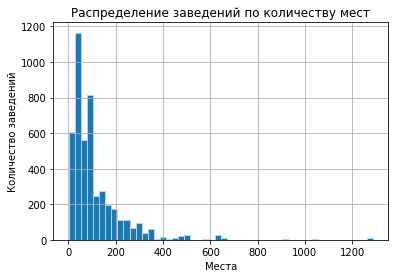

In [14]:
ax = food_df['seats'].hist(bins=50, edgecolor = "lightblue")
ax.set_xlabel('Места')
ax.set_ylabel('Количество заведений')
ax.set_title('Распределение заведений по количеству мест');

Конечно, есть заведения, которые рассчитаны на несколько сотен гостей - можно посмотреть, например, <a href="https://ru.foursquare.com/user/48810683/list/10-%D1%81%D0%B0%D0%BC%D1%8B%D1%85-%D0%B1%D0%BE%D0%BB%D1%8C%D1%88%D0%B8%D1%85-%D1%80%D0%B5%D1%81%D1%82%D0%BE%D1%80%D0%B0%D0%BD%D0%BE%D0%B2-%D0%BC%D0%BE%D1%81%D0%BA%D0%B2%D1%8B">тут</a>. Но таких мест единицы, и мы будем рассматривать большое их количество как выбросы в рамках нашего исследования.

In [15]:
food_df['seats'].quantile(0.94)

300.0

94% всех заведений имеют не больше 300 мест. Уберем все, что свыше.

In [16]:
# до удаления:
print(len(food_df))

food_df = food_df.drop(food_df[food_df['seats'] > 300].index)

# проверим результат
print(len(food_df))

8406
8155


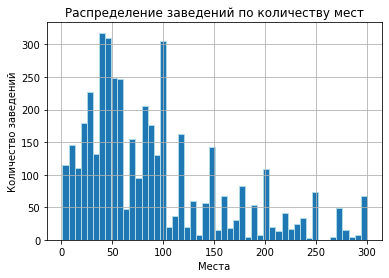

In [17]:
ax = food_df['seats'].hist(bins=50, edgecolor = "lightblue")
ax.set_xlabel('Места')
ax.set_ylabel('Количество заведений')
ax.set_title('Распределение заведений по количеству мест');

Основная масса принимает не больше 100 гостей.

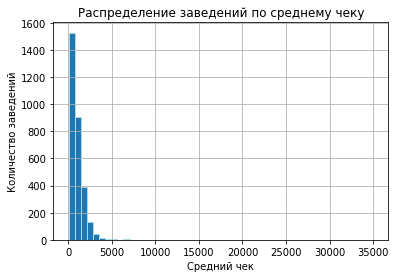

In [18]:
ax = food_df['middle_avg_bill'].hist(bins=50, edgecolor = "lightblue")
ax.set_xlabel('Средний чек')
ax.set_ylabel('Количество заведений')
ax.set_title('Распределение заведений по среднему чеку')
plt.xticks(rotation=0);

Распределение по среднему чеку тоже имеет выброс вправо. Посмотрим на количественную характеристику:

In [19]:
food_df['middle_avg_bill'].quantile(0.99)

3750.0

99% заведений имеют средний чек не больше 3750. Таким образом, установив верхнюю границу в 5000, мы уберем выбросы и практически не окажем влияния на набор имеющихся данных.

In [20]:
print(len(food_df))
food_df = food_df.drop(food_df[food_df['middle_avg_bill'] > 5000].index)

# проверим результат
print(len(food_df))

8155
8144


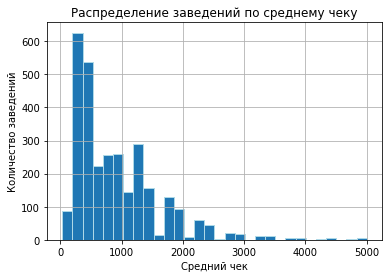

In [21]:
ax = food_df['middle_avg_bill'].hist(bins=30, edgecolor = "lightblue")
ax.set_xlabel('Средний чек')
ax.set_ylabel('Количество заведений')
ax.set_title('Распределение заведений по среднему чеку')
plt.xticks(rotation=0);

Сбросим индексы после удаления выбросов:

In [22]:
food_df = food_df.reset_index(drop=True)

Посмотрим на выброс в средней стоимости чашки капучино :

In [23]:
food_df.sort_values(by='middle_coffee_cup' ,ascending=False).head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,distance,street,is_24/7
2763,Шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.78,37.71,4.20,средние,Цена чашки капучино:230–2907 ₽,NaN,"1,568.00",1,48.00,6654,Большая Семёновская улица,False
5323,Coffee FM,кофейня,"Москва, Авиамоторная улица, 10, корп. 1",Юго-Восточный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–19:00",55.75,37.72,4.30,NaN,Цена чашки капучино:250–500 ₽,NaN,375.00,0,190.00,6104,Авиамоторная улица,False
3610,Кафетериус,кофейня,"Москва, Большая Никитская улица, 35",Центральный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.76,37.60,4.30,средние,Цена чашки капучино:279–378 ₽,NaN,328.00,1,30.00,1616,Большая Никитская улица,False
1718,Шоколадница,кофейня,"Москва, Бутырская улица, 95",Северный административный округ,пн-чт 07:30–23:00; пт 07:30–00:00; сб круглосу...,55.81,37.58,4.10,средние,Цена чашки капучино:300–350 ₽,NaN,325.00,1,61.00,6678,Бутырская улица,False
5800,Диемм,кофейня,"Москва, 3-я Фрунзенская улица, 1",Центральный административный округ,"ежедневно, 08:30–23:00",55.72,37.58,4.30,средние,Цена чашки капучино:250–390 ₽,NaN,320.00,0,30.00,4250,3-я Фрунзенская улица,False


Первое значение - явная ошибка, мы уже обратили на это внимание при загрузке данных. 

`"Цена чашки капучино:230–2907 ₽"` - явно лишняя `"7"`, случайно нажали. Если убрать, среднее получится 260 - что уже является нормой.

Откорректируем:

In [24]:
food_df.loc[2763, 'middle_coffee_cup'] = 260

In [25]:
food_df.sort_values(by='middle_coffee_cup' ,ascending=False).head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,distance,street,is_24/7
5323,Coffee FM,кофейня,"Москва, Авиамоторная улица, 10, корп. 1",Юго-Восточный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–19:00",55.75,37.72,4.30,NaN,Цена чашки капучино:250–500 ₽,NaN,375.00,0,190.00,6104,Авиамоторная улица,False
3610,Кафетериус,кофейня,"Москва, Большая Никитская улица, 35",Центральный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.76,37.60,4.30,средние,Цена чашки капучино:279–378 ₽,NaN,328.00,1,30.00,1616,Большая Никитская улица,False
1718,Шоколадница,кофейня,"Москва, Бутырская улица, 95",Северный административный округ,пн-чт 07:30–23:00; пт 07:30–00:00; сб круглосу...,55.81,37.58,4.10,средние,Цена чашки капучино:300–350 ₽,NaN,325.00,1,61.00,6678,Бутырская улица,False
5800,Диемм,кофейня,"Москва, 3-я Фрунзенская улица, 1",Центральный административный округ,"ежедневно, 08:30–23:00",55.72,37.58,4.30,средние,Цена чашки капучино:250–390 ₽,NaN,320.00,0,30.00,4250,3-я Фрунзенская улица,False
2002,Il Tocco,кофейня,"Москва, Ходынский бульвар, 11А",Северный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–22:00",55.79,37.53,4.10,средние,Цена чашки капучино:280–350 ₽,NaN,315.00,0,NaN,6713,Ходынский бульвар,False


Теперь все ОК.

Посмотрим, сколько записей у нас осталось:

### Проверка на неявные дубликаты.

Проверим на неявные дубликаты по комбинации название+адрес.

In [26]:
# приведем название и адрес к нижнему регистру:
food_df['n'] = food_df['name'].str.lower()
food_df['a'] = food_df['address'].str.lower()

# теперь проверим на дубликаты:
food_df[['n','a']].duplicated().sum()

4

Удалим их:

In [27]:
print(len(food_df))

food_df = food_df.drop(food_df[food_df[['n','a']].duplicated()].index)
print(len(food_df))

8144
8140


Удалим технические столбцы за ненадобностью:

In [28]:
food_df = food_df.drop(['n','a'], axis=1)

In [29]:
print(f'После удаления выбросов осталось {round(len(food_df) / 8406 * 100, 1)}% данных')

После удаления выбросов осталось 96.8% данных


### Вывод. Предобработка данных.

Были добавлены 2 столбца:
* `street` - с названием улицы
* `is_24/7` - содержаший `True` для тех заведений, по котороым есть данные, что они ежедневно и круглосуточно работают, и `False` для всех остальных.

В столбцах, содержащих информацию о среднем чеке и количестве мест нулевые значения заменены на `nan`.

Преведена фильтрация данных по 2 параметрам - среднему чеку и вместимости.

Откорректирован выброс `'стоимость чашки капучино'` = 1,568.00, новое значение - 260.00.

Установлены предельные значения:
* для среднего чека - 5000
* для вместимости - 300

Выбросы удалены.
Нулевые значения заменены на `np.nan`

Проверили данные на неявные дубликаты по комбинации название+адрес. Нашли 4 дубликата. Удалили.

После предобработки осталось 96,8% данных - показатель в норме.

## Этап 3. Анализ данных.

### Распределение заведений по категориям.

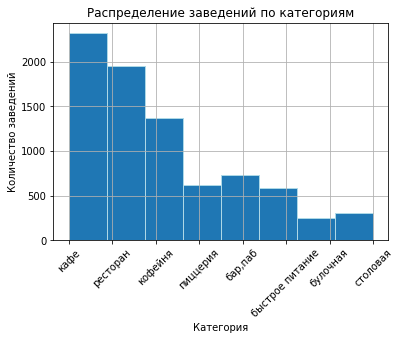

In [30]:
ax = food_df['category'].hist(bins=8, edgecolor = "lightblue")
ax.set_xlabel('Категория')
ax.set_ylabel('Количество заведений')
ax.set_title('Распределение заведений по категориям')
plt.xticks(rotation=45);

Самые популярные - это кафе, затем рестораны и кофейни.

### Распределение заведений по вместимости.

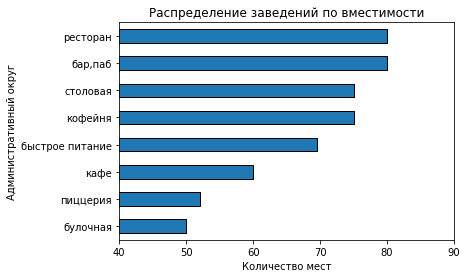

In [31]:
ax = food_df.pivot_table(index='category', values='seats', aggfunc='median') \
                .sort_values(by='seats') \
                .plot(kind='barh', edgecolor = "black") 
ax.set_ylabel('Административный округ')
ax.set_xlabel('Количество мест')
ax.set_title('Распределение заведений по вместимости')
ax.get_legend().remove()
plt.xlim(40,90)
plt.xticks(rotation=0);

Самые вместительные - это рестораны и бары/пабы, самые маленькие - кафе и пиццерии. Основной объем продаж типичной пиццерии - это доставка. Так что тут все логично. А вот чем булочная отличается от кафе, кроме вместимости, - трудно сказать.

### Соотношение сетевых и несетевых заведений.

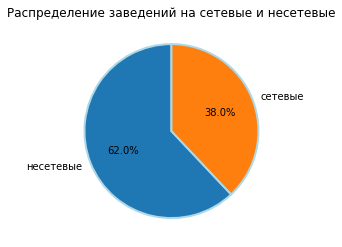

In [32]:
fig, ax = plt.subplots()
ax.pie(x=[len(food_df[food_df['chain'] == 0]), len(food_df[food_df['chain'] == 1])],
       labels=['несетевые','сетевые'],
       autopct='%1.1f%%', 
       pctdistance=0.6, 
       startangle=90,  
       wedgeprops={"edgecolor":"lightblue",'linewidth': 2, 'linestyle': '-'})
ax.set_title('Распределение заведений на сетевые и несетевые');

Доля сетевых заведений составляет 38%.

Рассмотрим это же распределение в разрезе категорий:

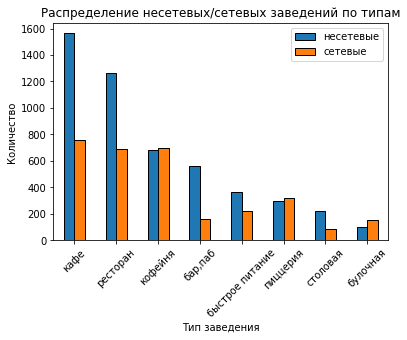

In [33]:
ax = (food_df.pivot_table(index='category', 
                        values='name', 
                        columns='chain', aggfunc='count')
             .sort_values(by=0, ascending=False)
             .plot(kind='bar', edgecolor = "black")
)
ax.set_ylabel('Количество')
ax.set_xlabel('Тип заведения')
ax.set_title('Распределение несетевых/сетевых заведений по типам')
ax.legend(['несетевые', 'сетевые'])
plt.xticks(rotation=45);

Доля сетевых заведений больше несетевых в 3 категориях:
* кофейни
* пиццерии
* булочные

Рассмотрим каждую из категорий более наглядно:

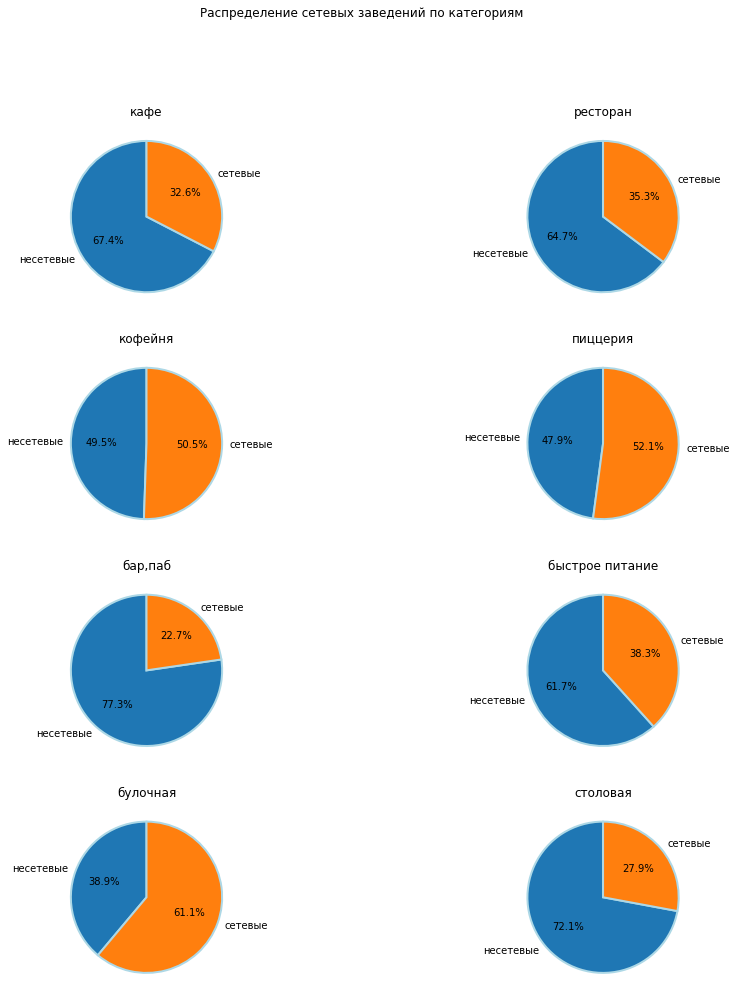

In [34]:
# подготовим список категорий:
category = food_df['category'].unique()

# подготовим общие параметры:
fig, axs = plt.subplots(4, 2, figsize = [15,16])
fig.suptitle('Распределение сетевых заведений по категориям')

# построим диаграмму для каждой из категорий:
for i, ax in enumerate(axs.flatten()):
    non_chain = len(food_df[(food_df['chain'] == 0) & (food_df['category'] == category[i])])
    chain = len(food_df[(food_df['chain'] == 1) & (food_df['category'] == category[i])])
    ax.pie(x=[non_chain, chain],
       labels=['несетевые','сетевые'],
       autopct='%1.1f%%', 
       pctdistance=0.6, 
       startangle=90,  
       wedgeprops={"edgecolor":"lightblue",'linewidth': 2, 'linestyle': '-'})
    ax.set_title(f'{category[i]}') 

Наибольшие доли сетевых заведений в категории "булочная" - 61.1%, "пиццерия " - 52.1% и кофейня - 50.5%.

Наименьшие - в "бар,паб" - 22.8%, "столовая" - 27.9% и "кафе" - 32.6%.

### ТОП15 популярных сетей (по количеству).

Выберем 15 самых популярных (по количеству) сетевых заведений:

In [35]:
chains_top15 = (food_df[food_df['chain'] == 1].
      groupby(by='name')[['name', 'category']]
      .agg(qty = ('name','count'), category=('category', 'first'))
     )

chains_top15 = chains_top15.sort_values(by='qty', ascending=False)
chains_top15 = chains_top15.head(15)
chains_top15

,qty,category
name,,
Шоколадница,115,кофейня
Домино'с Пицца,76,пиццерия
Додо Пицца,72,пиццерия
One Price Coffee,68,кофейня
Яндекс Лавка,67,ресторан
Cofix,63,кофейня
Prime,47,ресторан
Хинкальная,44,быстрое питание
КОФЕПОРТ,40,кофейня


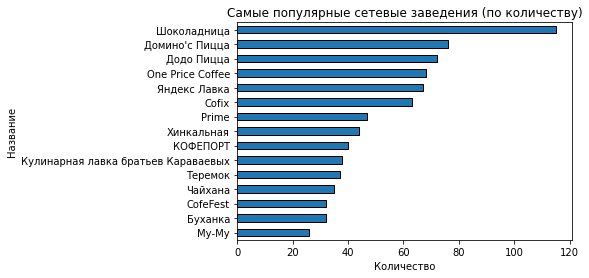

In [36]:
ax = chains_top15[::-1].plot(kind='barh', y='qty', edgecolor = "black")
ax.set_xlabel('Количество')
ax.set_ylabel('Название')
ax.set_title('Самые популярные сетевые заведения (по количеству)')
ax.get_legend().remove()
plt.xticks(rotation=0);

Посмотрим на ТОП15 сетевых заведений в разрезе категорий:

In [37]:
chains_top15_grouped = (chains_top15.groupby(by='category')[['category','qty']]
     .agg(qty=('category','count'), units=('qty','sum'))
     .sort_values(by='qty', ascending=False)
     )
chains_top15_grouped

,qty,units
category,,
кофейня,5,318
кафе,3,99
ресторан,3,151
пиццерия,2,148
булочная,1,32
быстрое питание,1,44


Построим графики распределения ТОП15 сетевых заведений:

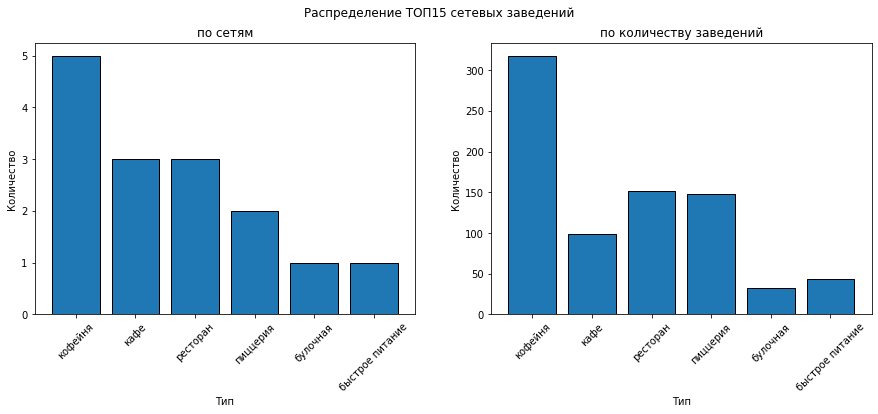

In [38]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=[15,5])
fig.suptitle('Распределение ТОП15 сетевых заведений')

# по сетям:
ax1.bar(x=chains_top15_grouped.index, height=chains_top15_grouped['qty'], edgecolor = "black")
ax1.set_ylabel('Количество')
ax1.set_xlabel('Тип')
ax1.set_title('по сетям')
plt.setp(ax1.get_xticklabels(), rotation=45)

# по количеству заведений:
ax2.bar(x=chains_top15_grouped.index, height=chains_top15_grouped['units'], edgecolor = "black")
ax2.set_ylabel('Количество')
ax2.set_xlabel('Тип')
ax2.set_title('по количеству заведений')
plt.setp(ax2.get_xticklabels(), rotation=45);

В ТОП15 сетевых заведений не попали представители категорий:
1. Бар, паб
2. Столовая

### Распределение количества заведений по округам.

У нас имеются данные по 9 административным округам:
* Северный
* Северо-Восточный
* Северо-Западный
* Западный
* Центральный
* Восточный
* Юго-Восточный
* Южный
* Юго-Западный

Добавим в таблицу кортокое название административного округа:

In [39]:
food_df['district_short'] = food_df['district'].apply(lambda x: x.split()[0])

Теперь можно построить график:

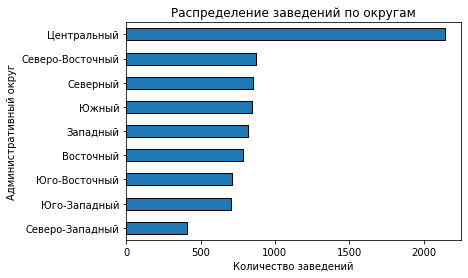

In [40]:
ax = food_df.pivot_table(index='district_short', values='name', aggfunc='count') \
                .sort_values(by='name') \
                .plot(kind='barh', edgecolor = "black") 
ax.set_ylabel('Административный округ')
ax.set_xlabel('Количество заведений')
ax.set_title('Распределение заведений по округам')
ax.get_legend().remove()
plt.xticks(rotation=0);

Посмотрим, как распределены категории заведений по округам:

In [41]:
food_df.pivot_table(index='district_short', columns='category' ,values='name', aggfunc='count', margins=True) \
    .sort_values(by='All') \
    .drop('All', axis=1)

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district_short,,,,,,,,
Северо-Западный,22,12,30,114,62,40,109,17
Юго-Западный,38,27,61,236,95,64,166,17
Юго-Восточный,38,13,67,282,89,55,142,25
Восточный,45,25,69,269,104,72,159,40
Западный,46,37,62,231,146,70,207,23
Южный,65,24,77,257,123,70,186,42
Северный,63,37,55,227,184,69,178,40
Северо-Восточный,61,28,81,260,156,68,180,39
Центральный,349,49,85,444,414,108,630,65


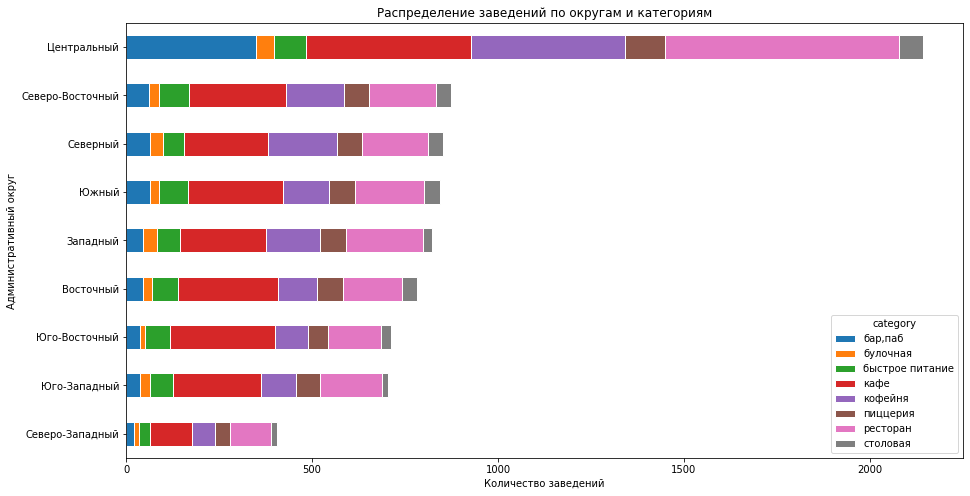

In [42]:
ax = food_df.pivot_table(index='district_short', columns='category' ,values='name', aggfunc='count', margins=True) \
    .sort_values(by='All') \
    .drop('All', axis=0) \
    .drop('All', axis=1) \
    .plot.barh(stacked=True, edgecolor='white', figsize=[15,8])
ax.set_ylabel('Административный округ')
ax.set_xlabel('Количество заведений')
ax.set_title('Распределение заведений по округам и категориям')
plt.xticks(rotation=0);

Центральный округ в топе, а по количеству баров, ресторанов и кофеен он в разы больше, чем любой из остальных округов. Остальные типы заведений распределены более равномерно.

### Распределение заведений по рейтингу.

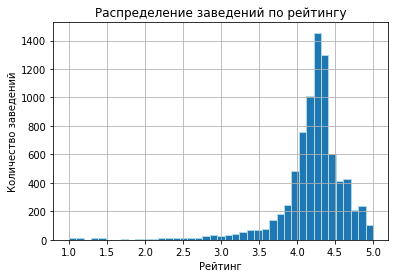

In [43]:
ax = food_df['rating'].hist(bins=41, edgecolor = "lightblue")
ax.set_xlabel('Рейтинг')
ax.set_ylabel('Количество заведений')
ax.set_title('Распределение заведений по рейтингу');

Наиболее часто встречающийся рейтинг - от 4.0 до 4.5. Если рейтинг заведения выведен на основании достаточного количества оценок (не единичные) и он ниже 4, то туда лучше не заходить.

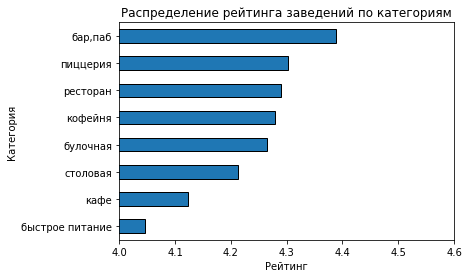

In [44]:
ax = food_df.pivot_table(index='category', values='rating', aggfunc='mean') \
                .sort_values(by='rating') \
                .plot(kind='barh', edgecolor='black') 
ax.set_ylabel('Категория')
ax.set_xlabel('Рейтинг')
ax.set_title('Распределение рейтинга заведений по категориям')
ax.get_legend().remove()
plt.xlim(4,4.6)
plt.xticks(rotation=0);

Наивысший рейтинг - у баров,пабов, низший - у заведений быстрого питания.

Похоже, что нельзя напрямую сравнивать рейтинги заведений различных категорий, в бар идут с хорошим настроением, + алкоголь, отсюда и высокие рейтинги. Для быстрого питания ситуация другая - человек стремится как можно быстрее перекусить, весь в делах, а тут очередь, нет свободных мест, как результат страдает рейтинг. Для пиццерии, учитывая специфику, весомую роль может играть скорость доставки, что не характерно для других категорий. Профиль клиента по категориям тоже различается.

Можно предположить, что для каждой из категорий рейтинг складывается из разных параметров с разным весом и общего у них только слово "рейтинг". Сравнивать имеет смысл только внутри категории.

### Фоновая картограмма со средним рейтингом заведений каждого района.

Построим датафрейм со средними значенями рейтингов по округам:

In [45]:
rating_df = food_df.groupby('district', as_index=False)['rating'].agg('mean')
rating_df.sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
8,Южный административный округ,4.18
1,Западный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


Теперь сам хороплет:

In [46]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.7,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самые рейтинговые округа:
* Центральный - 4.38
* Северный - 4.24
* Северо-Западный - 4.21

### Отобразим все заведения датасета на карте с помощью кластеров.

In [47]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

# применяем функцию create_clusters() к каждой строке датафрейма
food_df.apply(create_clusters, axis=1)

# выводим карту
m

<div class="alert alert-success">
<b>✔️ Комментарий ревьюера v1:</b> 
<br>Картограмма построена верно!
</div>

### ТОП15 улиц по количеству заведений.

In [48]:
top15_streets = food_df.pivot_table(index='street', values='name', aggfunc='count') \
           .sort_values(by='name', ascending=False).rename(columns={'name':'qty'}).head(15)
top15_streets

,qty
street,
проспект Мира,182
Профсоюзная улица,122
Ленинский проспект,101
проспект Вернадского,97
Варшавское шоссе,73
Ленинградский проспект,72
Ленинградское шоссе,70
Дмитровское шоссе,70
Каширское шоссе,66


В список, что очевидно, попали самые длинные улицы Москвы (МКАД тоже будем считать улицей). Взаимосвязи между длиной и количеством заведений нет. Самая длинная классическая улица - Профсоюзная - на втором месте, МКАД (самая длинная) - на десятом.

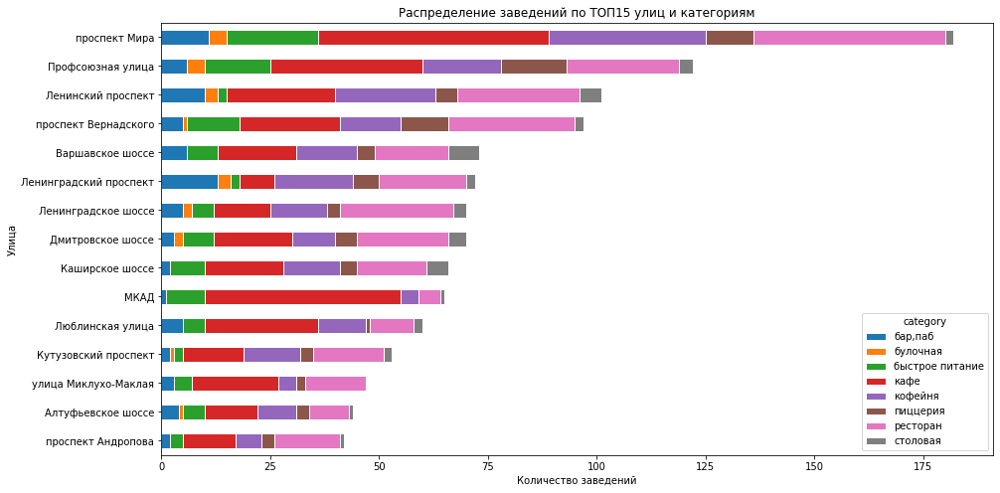

In [49]:
ax = (food_df[food_df['street'].isin(top15_streets.index.to_list())]
      .pivot_table(index='street', values='name', columns='category', aggfunc={'name':'count'}, margins=True)
     ).fillna(0).astype('int64') \
      .sort_values(by='All') \
      .drop('All', axis=0) \
      .drop('All', axis=1) \
      .plot.barh(stacked=True, edgecolor='white', figsize=[15,8])
ax.set_ylabel('Улица')
ax.set_xlabel('Количество заведений')
ax.set_title('Распределение заведений по ТОП15 улиц и категориям')
plt.xticks(rotation=0);

Лидер - Проспект Мира, на нем присутствуют все 8 категорий.

Выделяется МКАД - баров практически нет (основной траффик - автомобильный) и больше половины это кафе. Очень вероятно, что если сравнить структуру распределения на МКАД и в ТЦ, то они будут практически идентичны. Отдельностоящие здания на МКАД - это большая редкость, в основном ТЦ.

### Улицы, на которых находится только один объект общепита.

In [50]:
poor_streets = food_df.pivot_table(index='street', values='name', aggfunc='count') \
           .sort_values(by='name').rename(columns={'name':'qty'})
poor_streets = poor_streets[poor_streets['qty'] == 1]
poor_streets

,qty
street,
1-й Автозаводский проезд,1
Одинцовская улица,1
Октябрьский переулок,1
Ордынский тупик,1
Оренбургская улица,1
...,...
1-я Курьяновская улица,1
1-я Стекольная улица,1
5-й проезд Подбельского,1


458 улиц = 458 заведений. Это улицы с наименьшей проходимостью, короткие, тупиковые, промзоны - там мало людей. В рамках нашего исследования интереса не представляют.

In [51]:
poor_streets_category = food_df[food_df['street'].isin(poor_streets.index.to_list())] \
    .value_counts(subset='category').to_frame()

if local_flag == False :
    poor_streets_category = poor_streets_category.rename(columns={0:'count'})

poor_streets_category
poor_streets_category['share'] = poor_streets_category['count'] / poor_streets_category['count'].sum()
poor_streets_category.style.format({'share' : '{:.1%}' })

,count,share
category,,
кафе,160,34.9%
ресторан,93,20.3%
кофейня,85,18.5%
"бар,паб",39,8.5%
столовая,36,7.8%
быстрое питание,23,5.0%
пиццерия,15,3.3%
булочная,8,1.7%


ТОП3 категорий:
* кафе
* ресторан
* кофейня

сотавляют 73.6% всех заведений.

### Фоновая картограмма (хороплет) с медианными значениями среднего чека для каждого района.

Построим датафрейм с медианными значенями среднего чека по округам:

In [52]:
median_bill = food_df.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
median_bill.sort_values(by='middle_avg_bill', ascending=False)

,district,middle_avg_bill
5,Центральный административный округ,"1,000.00"
1,Западный административный округ,975.00
4,Северо-Западный административный округ,687.50
2,Северный административный округ,650.00
7,Юго-Западный административный округ,600.00
0,Восточный административный округ,537.50
3,Северо-Восточный административный округ,500.00
8,Южный административный округ,500.00
6,Юго-Восточный административный округ,444.50


Теперь можно строить хороплет:

In [53]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.7,
    legend_name='Медианное значение среднего чека по районам',
).add_to(m)

# выводим карту
m

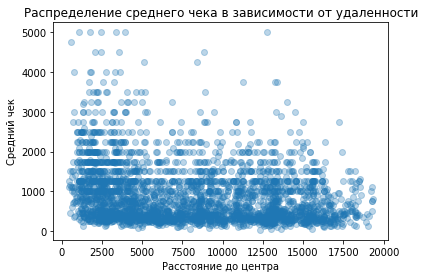

In [54]:
plt.scatter(x='distance', y='middle_avg_bill', data=food_df, alpha=0.3)
plt.title("Распределение среднего чека в зависимости от удаленности")
plt.xlabel("Расстояние до центра")
plt.ylabel("Средний чек");

Явной зависимости нет. До 5 километров от центра имеет место увеличение среднего чека.

Посмотрим детально на Центральный и Западный округа:

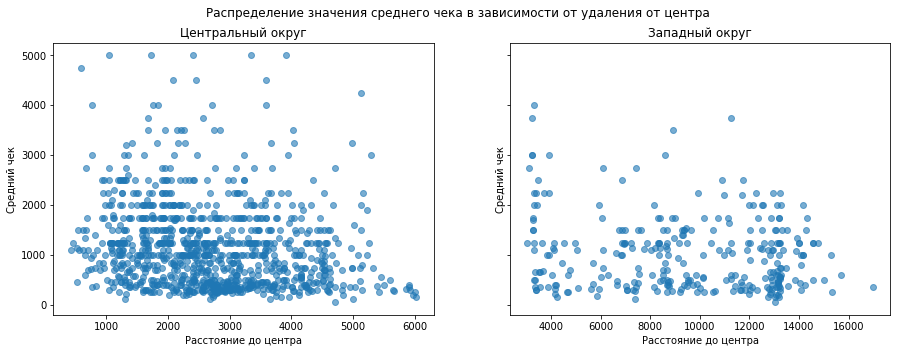

In [55]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=[15,5], sharey=True)
fig.suptitle('Распределение значения среднего чека в зависимости от удаления от центра')

# Центральный округ:
ax1.scatter(x='distance', 
            y='middle_avg_bill', 
            data=food_df[food_df['district_short'] == 'Центральный'], 
            alpha=0.6)
ax1.set_ylabel('Средний чек')
ax1.set_xlabel('Расстояние до центра')
ax1.set_title('Центральный округ')
plt.setp(ax1.get_xticklabels(), rotation=0)

# Западный округ:
ax2.scatter(x='distance', 
            y='middle_avg_bill', 
            data=food_df[food_df['district_short'] == 'Западный'], 
            alpha=0.6)
ax2.set_ylabel('Средний чек')
ax2.set_xlabel('Расстояние до центра')
ax2.set_title('Западный округ')
plt.setp(ax2.get_xticklabels(), rotation=0);

Прямой зависимости между удалённостью от центра и средним чеком нет.

Самые дорогие - Центральный и Западный округа. Внутри округа нелинейная зависимость среднего чека от удаления от центра прослеживается.

### Дополнительные исследования. Данные Мосстата.

Сделаем сводную таблицу по округам с количеством заведений, средним чеком, рейтингом и количеством мест и добавим данные <a href="https://77.rosstat.gov.ru/storage/mediabank/%D0%9C%D0%BE%D1%81%D0%BA%D0%B2%D0%B0%20%D0%B2%20%D1%86%D0%B8%D1%84%D1%80%D0%B0%D1%85%202021.pdf">Мосстата </a> по административным округам Москвы по площади и населению (стр.9).

In [56]:
# сделаем сводную таблицу по округам с количеством заведений, средним чеком, рейтингом и количеством мест
rosstat_info = food_df.pivot_table(index='district_short', 
                                       values=['name',
                                               'middle_avg_bill', 
                                               'rating',
                                               'seats'], 
                                       aggfunc={'name':'count',
                                                'middle_avg_bill':'mean',
                                                'rating':'mean',
                                                'seats':'mean'}) \
                                       .sort_values(by='name')

# переименуем столбец на интуитивно понятный
rosstat_info.rename(columns={'name':'food_units'}, inplace=True)

# добавим данные о площади округов (стр.9 отчета)
rosstat_info['district_area_km2'] = [93,112,123,155,194,102,131,102, 66]

# упорядочим столбцы
cols = rosstat_info.columns.to_list()
cols = cols[1:2] + cols[0:1] + cols[2:]
rosstat_info = rosstat_info[cols]

# отсортируем по количеству заведений
rosstat_info = rosstat_info.sort_values(by='food_units', ascending=False)

# посмотрим результат
rosstat_info

,food_units,middle_avg_bill,rating,seats,district_area_km2
district_short,,,,,
Центральный,2144,"1,160.96",4.38,98.64,66
Северо-Восточный,873,714.98,4.15,91.76,102
Северный,853,889.06,4.24,77.07,131
Южный,844,723.08,4.18,91.40,102
Западный,822,"1,024.45",4.18,110.19,194
Восточный,783,757.33,4.17,67.59,155
Юго-Восточный,711,649.19,4.10,85.82,123
Юго-Западный,704,792.71,4.17,81.42,112
Северо-Западный,406,821.08,4.21,98.67,93


Принимая во внимание отсутствие данных о туристическом траффике и ежедневной миграции, загружать данные о населении по округам (стр.14 отчета) в рамках нашего исследования особого смысла нет.

Посмотрим на распределение заведений по площади по округам:

In [57]:
rosstat_info['units_per_km2'] = rosstat_info['food_units'] / rosstat_info['district_area_km2']
rosstat_info.sort_values(by='units_per_km2', ascending=False)

,food_units,middle_avg_bill,rating,seats,district_area_km2,units_per_km2
district_short,,,,,,
Центральный,2144,"1,160.96",4.38,98.64,66,32.48
Северо-Восточный,873,714.98,4.15,91.76,102,8.56
Южный,844,723.08,4.18,91.40,102,8.27
Северный,853,889.06,4.24,77.07,131,6.51
Юго-Западный,704,792.71,4.17,81.42,112,6.29
Юго-Восточный,711,649.19,4.10,85.82,123,5.78
Восточный,783,757.33,4.17,67.59,155,5.05
Северо-Западный,406,821.08,4.21,98.67,93,4.37
Западный,822,"1,024.45",4.18,110.19,194,4.24


Посмотрим на распределение заведений по удаленности по округам:

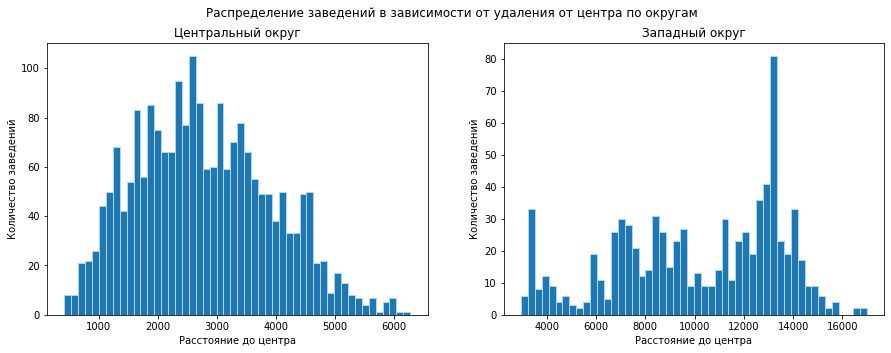

In [58]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=[15,5])

fig.suptitle('Распределение заведений в зависимости от удаления от центра по округам')
ax1.hist(x=food_df[food_df['district_short'] == 'Центральный']['distance'], bins=50, edgecolor = "lightblue")
ax1.set_ylabel('Количество заведений')
ax1.set_xlabel('Расстояние до центра')
ax1.set_title('Центральный округ')

ax2.hist(x=food_df[food_df['district_short'] == 'Западный']['distance'], bins=50, edgecolor = "lightblue")
ax2.set_ylabel('Количество заведений')
ax2.set_xlabel('Расстояние до центра')
ax2.set_title('Западный округ');

Построим объединенный хроноплет по среднему чеку с количеством заведений и их рейтингом:

In [59]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.7,
    legend_name='Медианное значение среднего чека по районам',
).add_to(m)

marker_cluster = MarkerCluster().add_to(m)

# применяем функцию create_clusters() к каждой строке датафрейма
food_df.apply(create_clusters, axis=1)

# выводим карту
m

Распределение по удаленности в цифрах:

In [60]:
food_df[food_df['district_short'] == 'Западный']['distance'].quantile(0.95)

14308.75

Ожидаемо, что Центральный округ имеет наибольшую плотность заведений. 

Сюрприз от Западного округа - наименьшая плотность. Но, если взглянуть на карту, видно, что большАя часть округа приходится на его часть за МКАД, по которой данных нет. А гистограмма и расчет нам это подтверждают, основное распределение находится в пределах до 14.3 км от центра (95% всех заведений округа).

Остальные исследования в общем не будут полезны в рамках нашего исследования - подготовки рекомендаций по открытию кофейни. Мы сделаем их в разрезе именно кофеен. К примеру, для бара является плюсом круглосуточный режим работы (если, конечно, это оправавно экономически для каждой конкретной точки), но это же становится крайне сомнительным преимуществом для кофейни - после 21-00 кофе, как правило, уже не пьют.

### Вывод. Анализ данных.

Самые популярные по категориям - это кафе, затем рестораны и кофейни.

Самые вместительные - это рестораны и бары/пабы, самые маленькие - кафе и пиццерии. Основной объем продаж типичной пиццерии - это доставка. Так что тут все логично.

Доля сетевых заведений составляет 38%.
Доля сетевых заведений больше несетевых в 3 категориях:
* кофейни
* пиццерии
* булочные

Наибольшие доли сетевых заведений в категориях:
* булочная - 61.1% 
* пиццерия - 52.1% 
* кофейня - 50.5%

Наименьшие:
* бар,паб - 22.8% 
* столовая - 27.9% 
* кафе - 32.6%.

В ТОП15 сетевых заведений попали:
* 'Шоколадница',
*  "Домино'с Пицца",
*  'Додо Пицца',
*  'One Price Coffee',
*  'Яндекс Лавка',
*  'Cofix',
*  'Prime',
*  'Хинкальная',
*  'КОФЕПОРТ',
*  'Кулинарная лавка братьев Караваевых',
*  'Теремок',
* 'Чайхана',
*  'CofeFest',
*  'Буханка',
*  'Му-Му'

Среди них категорий:
1. Бар, паб
2. Столовая
<br>не встречается вообще.

Распределение среди ТОП15 сетей выглядит следующим образом:
<table border="1" class="dataframe">  <thead>    <tr style="text-align: right;">      <th></th>      <th>qty</th>      <th>units</th>    </tr>    <tr>      <th>category</th>      <th></th>      <th></th>    </tr>  </thead>  <tbody>    <tr>      <th>кофейня</th>      <td>5</td>      <td>318</td>    </tr>    <tr>      <th>кафе</th>      <td>3</td>      <td>99</td>    </tr>    <tr>      <th>ресторан</th>      <td>3</td>      <td>151</td>    </tr>    <tr>      <th>пиццерия</th>      <td>2</td>      <td>148</td>    </tr>    <tr>      <th>булочная</th>      <td>1</td>      <td>32</td>    </tr>    <tr>      <th>быстрое питание</th>      <td>1</td>      <td>44</td>    </tr>  </tbody></table>

У нас имеются данные по 9 административным округам:
* Северный
* Северо-Восточный
* Северо-Западный
* Западный
* Центральный
* Восточный
* Юго-Восточный
* Южный
* Юго-Западный

Центральный округ в топе по количеству заведений, а по количеству баров, ресторанов и кофеен он в разы больше, чем любой из остальных округов. Остальные типы заведений распределены более равномерно.

Наиболее часто встречающийся рейтинг - от 4.0 до 4.5.

Наивысший рейтинг - у баров,пабов, низший - у заведений быстрого питания.

Похоже, что нельзя напрямую сравнивать рейтинги заведений различных категорий - в бар идут с хорошим настроением, + алкоголь, отсюда и высокие рейтинги. Для быстрого питания ситуация другая - человек стремится как можно быстрее перекусить, весь в делах, а тут очередь, нет свободных мест, как результат страдает рейтинг. Для пиццерии, учитывая специфику, весомую роль может играть скорость доставки, что не характерно для других категорий. Профиль клиента по категориям тоже различается.

Можно предположить, что для каждой из категорий рейтинг складывается из разных параметров с разным весом и общего у них только слово "рейтинг". Сравнивать имеет смысл только внутри категории.

Самые рейтинговые округа:
* Центральный - 4.38
* Северный - 4.24
* Северо-Западный - 4.21

ТОП15 улиц по количеству заведений:

<table border="1" class="dataframe">  <thead>    <tr style="text-align: right;">      <th></th>      <th>qty</th>    </tr>    <tr>      <th>street</th>      <th></th>    </tr>  </thead>  <tbody>    <tr>      <th>проспект Мира</th>      <td>183</td>    </tr>    <tr>      <th>Профсоюзная улица</th>      <td>122</td>    </tr>    <tr>      <th>Ленинский проспект</th>      <td>101</td>    </tr>    <tr>      <th>проспект Вернадского</th>      <td>97</td>    </tr>    <tr>      <th>Варшавское шоссе</th>      <td>73</td>    </tr>    <tr>      <th>Ленинградский проспект</th>      <td>72</td>    </tr>    <tr>      <th>Дмитровское шоссе</th>      <td>70</td>    </tr>    <tr>      <th>Ленинградское шоссе</th>      <td>70</td>    </tr>    <tr>      <th>Каширское шоссе</th>      <td>66</td>    </tr>    <tr>      <th>МКАД</th>      <td>65</td>    </tr>    <tr>      <th>Люблинская улица</th>      <td>60</td>    </tr>    <tr>      <th>Кутузовский проспект</th>      <td>53</td>    </tr>    <tr>      <th>улица Миклухо-Маклая</th>      <td>47</td>    </tr>    <tr>      <th>Алтуфьевское шоссе</th>      <td>44</td>    </tr>    <tr>      <th>проспект Андропова</th>      <td>42</td>    </tr>  </tbody></table>

В список, что очевидно, попали самые длинные улицы Москвы (МКАД тоже будем считать улицей). Взаимосвязи между длиной и количеством заведений нет. Самая длинная классическая улица - Профсоюзная - на втором месте, МКАД (самая длинная) - на десятом.

Лидер - Проспект Мира, на нем присутствуют все 8 категорий.

Выделяется МКАД - баров практически нет (основной траффик - автомобильный) и больше половины это кафе. Очень вероятно, что если сравнить структуру распределения на МКАД и в ТЦ, то они будут практически идентичны, отделностоящие здания на МКАД - это большая редкость, в основном ТЦ.

Улицы, на которых находится только один объект общепита.

458 улиц = 458 заведений. Это улицы с наименьшей проходимостью, короткие, тупиковые, промзоны - там мало людей. В рамках нашего исследования интереса не представляют.

ТОП3 категорий:
* кафе
* ресторан
* кофейня

сотавляют 73.6% всех заведений.

В рамках исследования  между медианными значениями среднего чека для каждого района прямой зависимости между удалённостью от центра и средним чеком не выявлено.

Самые дорогие - Центральный и Западный округа. Внутри округа прослеживается нелинейная зависимость среднего чека от удаления от центра.

После добавления данных об удаленности заведения от центра и данных Мосстата о площади административных округов стало возможным проделать дополнительный анализ.

Мы выяснили, что Центральный округ имеет наибольшую плотность заведений. 

Сюрприз от Западного округа - наименьшая плотность. Но, если взглянуть на карту, видно, что большАя часть округа приходится на его часть за МКАД, по которой данных нет. А гистограмма и расчет нам это подтверждают, основное распределение находится в пределах до 14.3 км от центра (95% всех заведений округа).

## Этап 4. Детализирование исследования: открытие кофейни.

### Общее количество кофеен, распределение по округам.

Посчитаем общее число кофеен и их долю:

In [61]:
print('Всего кофеен:',len(food_df[food_df['category'] == 'кофейня']))
print(f'Доля кофеен:', round( len(food_df[food_df['category'] == 'кофейня']) / len(food_df)*100,1),'%' )

Всего кофеен: 1373
Доля кофеен: 16.9 %


Подготовим сводные данные:

In [62]:
coffe_total = food_df.pivot_table(index='district_short', values='name', columns='category', aggfunc='count')
coffe_total['всего'] = coffe_total.sum(axis=1)
coffe_total['%%_кофеен'] = coffe_total['кофейня'] / coffe_total['всего'] 
coffe_total.sort_values(by='кофейня', ascending=False).style.format({ '%%_кофеен':'{:.1%}' })

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,всего,%%_кофеен
district_short,,,,,,,,,,
Центральный,349,49,85,444,414,108,630,65,2144,19.3%
Северный,63,37,55,227,184,69,178,40,853,21.6%
Северо-Восточный,61,28,81,260,156,68,180,39,873,17.9%
Западный,46,37,62,231,146,70,207,23,822,17.8%
Южный,65,24,77,257,123,70,186,42,844,14.6%
Восточный,45,25,69,269,104,72,159,40,783,13.3%
Юго-Западный,38,27,61,236,95,64,166,17,704,13.5%
Юго-Восточный,38,13,67,282,89,55,142,25,711,12.5%
Северо-Западный,22,12,30,114,62,40,109,17,406,15.3%


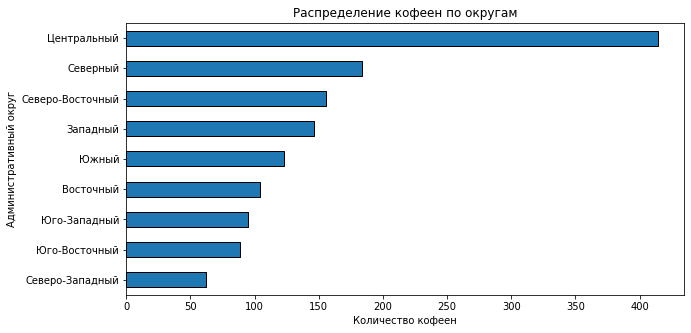

In [63]:
ax = coffe_total['кофейня'] \
    .sort_values() \
    .plot(kind='barh', edgecolor = "black", figsize=[10,5]) 
ax.set_ylabel('Административный округ')
ax.set_xlabel('Количество кофеен')
ax.set_title('Распределение кофеен по округам')
plt.xticks(rotation=0);

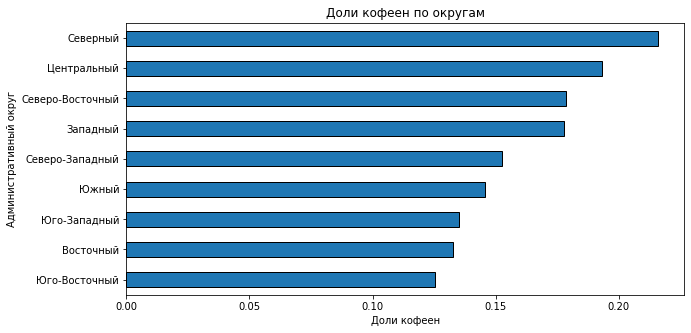

In [64]:
ax = coffe_total['%%_кофеен'] \
    .sort_values() \
    .plot(kind='barh', edgecolor = "black", figsize=[10,5]) 
ax.set_ylabel('Административный округ')
ax.set_xlabel('Доли кофеен')
ax.set_title('Доли кофеен по округам')
plt.xticks(rotation=0);

По количеству кофеен лидируют Центральный, Северный и Северо-Восточный округа. По доле лидер Северный округ.

Выберем данные только о кофейнях:

In [65]:
coffee = food_df[food_df['category'] == 'кофейня']

Нанесем данные на карту:

In [66]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee.apply(create_clusters, axis=1)

# выводим карту
m

Посмотрим на удаление от центра:

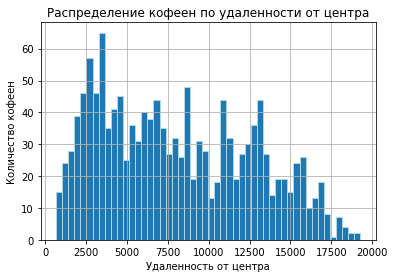

In [67]:
ax = coffee['distance'].hist(bins=50, edgecolor = "lightblue")
ax.set_xlabel('Удаленность от центра')
ax.set_ylabel('Количество кофеен')
ax.set_title('Распределение кофеен по удаленности от центра');

Теперь по округам:

In [68]:
districts = coffee['district_short'].unique()

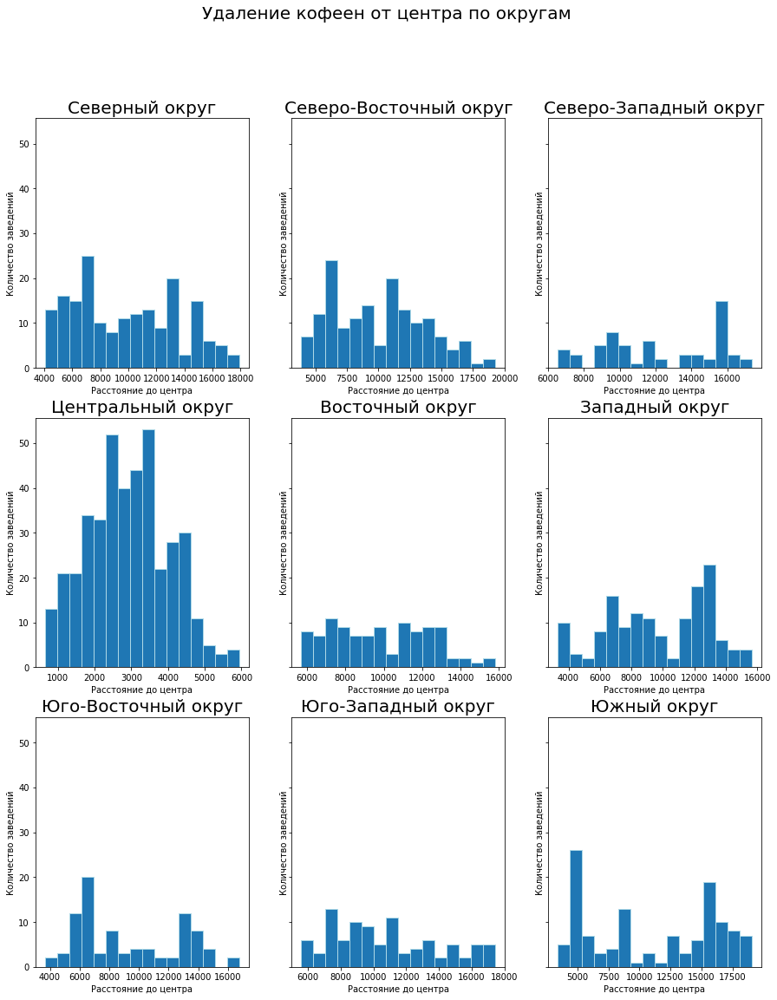

In [69]:
fig, axs = plt.subplots(3, 3, figsize = [15,18], sharey=True)
fig.suptitle('Удаление кофеен от центра по округам', fontsize=20)

for i, ax in enumerate(axs.flatten()):
    ax.hist(x=coffee[coffee['district_short'] == districts[i]]['distance'], bins=16, edgecolor = "lightblue")
    ax.set_ylabel('Количество заведений')
    ax.set_xlabel('Расстояние до центра')
    ax.set_title(f'{districts[i]} округ', fontsize=20);

По удалению кофеен от центра самое неравномерное распределение в Центральном округе - кофейни жмутся к третьему километру от центра. По остальным округам распределение более равномерное.

### Круглосуточные кофейни.

Посмотрим на распределение круглосуточных кофеен по округам:

In [70]:
coffee[coffee['is_24/7'] == True].pivot_table(index='district_short', 
                                              values='name', 
                                              aggfunc='count') \
                                 .rename(columns={'name':'qty'}) \
                                 .sort_values(by='qty', ascending=False)

,qty
district_short,
Центральный,25
Западный,9
Юго-Западный,7
Восточный,5
Северный,5
Северо-Восточный,3
Северо-Западный,2
Юго-Восточный,1
Южный,1


А всего их:

In [71]:
coffee[coffee['is_24/7'] == True].pivot_table(index='district_short', values='name', aggfunc='count')['name'].sum()

58

Мы располагаем данными о 58 круглосуточных кофейнях, 25 из которых - это 43% -  находятся в Центральном округе.

Полученные данные подтверждают гипотезу о том, что круглосуточный режим работы - сомнительное преимущество для кофейни (меньше 5% с таким режимом работы). Также желательно посетить их и посмотреть на меню, возможно, там есть алкогольные напитки и/или кальян и, значит, это не совсем кофейни.

### Рейтинги кофеен.

Посмотрим, как распределены рейтинги кофеен:

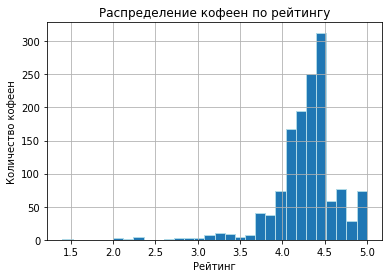

In [72]:
ax = coffee['rating'].hist(bins=30, edgecolor = "lightblue")
ax.set_xlabel('Рейтинг')
ax.set_ylabel('Количество кофеен')
ax.set_title('Распределение кофеен по рейтингу');

In [73]:
coffee['rating'].quantile(q=[0.2, 0.5, 0.8])

0.20   4.10
0.50   4.30
0.80   4.50
Name: rating, dtype: float64

Только 20% кофеен имеют рейтинг 4.1 и ниже, также только у 20% рейтинг выше 4.5. Поэтому, как мы установили раньше и подтвердили сейчас, будем рассматривать рейтинги в диапазоне 4.0 - 5.0.

Теперь посмотрим на средний рейтинг кофеен по округам:

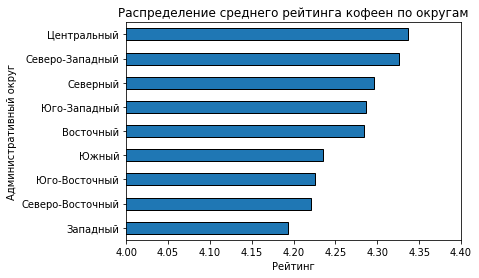

In [74]:
ax = coffee.pivot_table(index='district_short', values='rating', aggfunc='mean') \
                .sort_values(by='rating') \
                .plot(kind='barh', edgecolor = "black") 
ax.set_ylabel('Административный округ')
ax.set_xlabel('Рейтинг')
ax.set_title('Распределение среднего рейтинга кофеен по округам')
ax.set_xlim([4, 4.4])
ax.get_legend().remove()
plt.xticks(rotation=0);

Центральный округ на первом месте, сюрпризов нет.

А вот Западный округ, один из самых дорогих, имеет самый низкий средний рейтинг кофейни - интересно, запомним.

Теперь рассмотрим рейтинги кофеен по округам более детально:

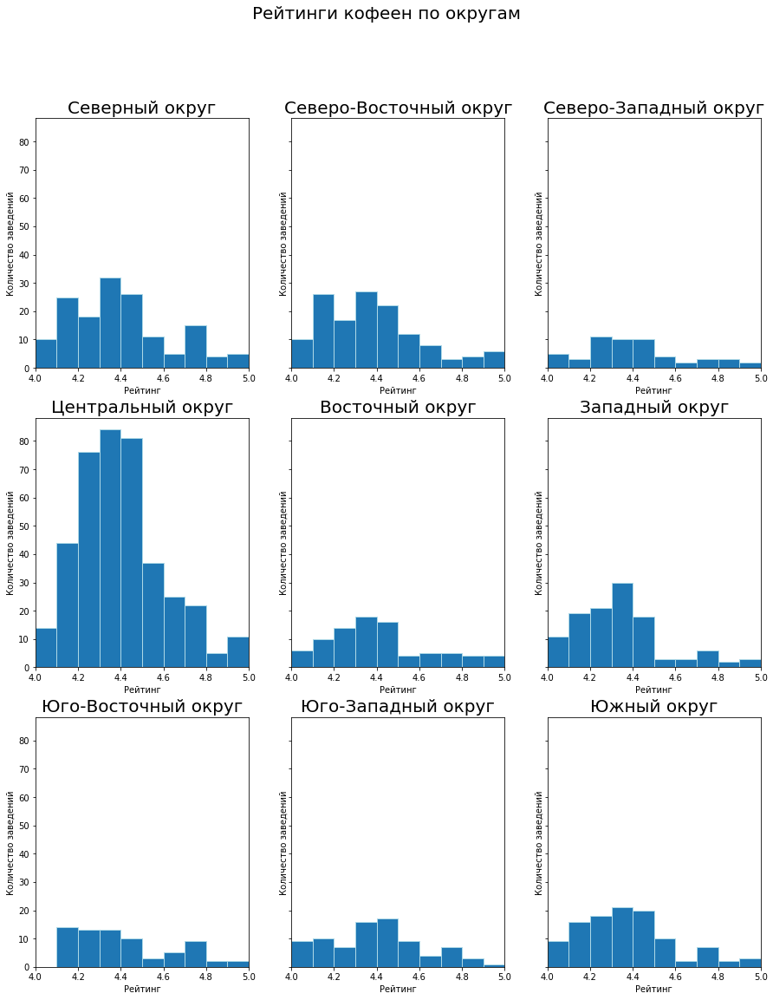

In [75]:
fig, axs = plt.subplots(3, 3, figsize = [15,18], sharey=True)
fig.suptitle('Рейтинги кофеен по округам', fontsize=20)

for i, ax in enumerate(axs.flatten()):
    ax.hist(x=coffee[coffee['district_short'] == districts[i]]['rating'], 
            bins=np.arange(4, 5.01, 0.1), 
            edgecolor = "lightblue")
    ax.set_ylabel('Количество заведений')
    ax.set_xlabel('Рейтинг')
    ax.set_xlim([4, 5])
    ax.set_title(f'{districts[i]} округ', fontsize=20);

В Западном округе после рейтинга 4.5 - резкий провал, имеем это ввиду.

### Стоимость чашки капучино.

Для контроля посмотрим на разницу среднего и медианного значений стоимости чашки капучино:

In [76]:
round((coffee['middle_coffee_cup'].mean() - coffee['middle_coffee_cup'].median()) 
      / coffee['middle_coffee_cup'].mean() * 100)

2

В процессе предобработки мы удалили выбросы, поэтому можем использовать для анализа средние значения. Разница в 2% между средним и медианным значениями это подтверждает.

In [77]:
round(coffee['middle_coffee_cup'].mean())

173

Средняя стоимость чашки капучино - 173 руб.

Посчитаем это значение по округам:

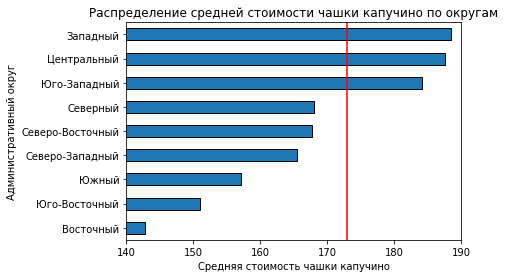

In [78]:
ax = coffee.pivot_table(index='district_short', values='middle_coffee_cup', aggfunc='mean') \
                .sort_values(by='middle_coffee_cup') \
                .plot(kind='barh', edgecolor = "black") 
ax.set_ylabel('Административный округ')
ax.set_xlabel('Средняя стоимость чашки капучино')
ax.set_title('Распределение средней стоимости чашки капучино по округам')
ax.set_xlim([140, 190])
ax.get_legend().remove()
ax.axvline(x=173, color='r') # добавим среднее значение на график
plt.xticks(rotation=0);

Сюрприз: Западный округ - самый дорогой. Притом, что рейтинг у него самый низкий. Центральный лишь на втором месте.

3 из 9 округов имеют значение больше среднего по городу.

### ТОП10 стоимости чашки капучино.

ТОП10 стоимости чашки капучино:

In [79]:
coffee.sort_values(by='middle_coffee_cup' ,ascending=False).head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,distance,street,is_24/7,district_short
5323,Coffee FM,кофейня,"Москва, Авиамоторная улица, 10, корп. 1",Юго-Восточный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–19:00",55.75,37.72,4.30,NaN,Цена чашки капучино:250–500 ₽,NaN,375.00,0,190.00,6104,Авиамоторная улица,False,Юго-Восточный
3610,Кафетериус,кофейня,"Москва, Большая Никитская улица, 35",Центральный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.76,37.60,4.30,средние,Цена чашки капучино:279–378 ₽,NaN,328.00,1,30.00,1616,Большая Никитская улица,False,Центральный
1718,Шоколадница,кофейня,"Москва, Бутырская улица, 95",Северный административный округ,пн-чт 07:30–23:00; пт 07:30–00:00; сб круглосу...,55.81,37.58,4.10,средние,Цена чашки капучино:300–350 ₽,NaN,325.00,1,61.00,6678,Бутырская улица,False,Северный
5800,Диемм,кофейня,"Москва, 3-я Фрунзенская улица, 1",Центральный административный округ,"ежедневно, 08:30–23:00",55.72,37.58,4.30,средние,Цена чашки капучино:250–390 ₽,NaN,320.00,0,30.00,4250,3-я Фрунзенская улица,False,Центральный
2002,Il Tocco,кофейня,"Москва, Ходынский бульвар, 11А",Северный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–22:00",55.79,37.53,4.10,средние,Цена чашки капучино:280–350 ₽,NaN,315.00,0,NaN,6713,Ходынский бульвар,False,Северный
2995,ДаблБи,кофейня,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 08:00–22:00",55.74,37.41,4.00,средние,Цена чашки капучино:250–350 ₽,NaN,300.00,1,276.00,13163,Ярцевская улица,False,Западный
3476,Циники,кофейня,"Москва, Богословский переулок, 8/15с1",Центральный административный округ,пн-чт 09:00–23:00; пт-вс 10:00–23:00,55.76,37.60,4.60,средние,Цена чашки капучино:250–350 ₽,NaN,300.00,0,NaN,1733,Богословский переулок,False,Центральный
4416,Ycp,кофейня,"Москва, Мясницкая улица, 13, стр. 21",Центральный административный округ,"пн-пт 09:00–22:00; сб,вс 10:00–22:00",55.76,37.63,4.80,NaN,Цена чашки капучино:300 ₽,NaN,300.00,0,NaN,1634,Мясницкая улица,False,Центральный
4495,Espressium,кофейня,"Москва, Большая Сухаревская площадь, 14/7",Центральный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.77,37.64,4.40,средние,Цена чашки капучино:от 300 ₽,NaN,300.00,0,30.00,2548,Большая Сухаревская площадь,False,Центральный
6464,Па Па Кофе,кофейня,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–01:00; вс 10:00...",55.66,37.48,4.20,средние,Цена чашки капучино:от 300 ₽,NaN,300.00,0,NaN,13231,проспект Вернадского,False,Западный


Самый дорогой кофе - 375 руб. за чашку - у заведения с рейтингом 4.3. У заведений с высокими рейтингами (4.6 и 4.8) стоимость 300 руб.

Стоимости чашки капучино у заведений ТОП10:

In [80]:
coffee.sort_values(by=['rating','middle_coffee_cup'] ,ascending=False).head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,distance,street,is_24/7,district_short
1771,Саббиа кофе,кофейня,"Москва, Ходынский бульвар, 4",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.79,37.53,5.00,NaN,Цена чашки капучино:195–295 ₽,NaN,245.00,0,100.00,7081,Ходынский бульвар,False,Северный
1277,Nero Bean Coffee Roastery,кофейня,"Москва, Ленинградский проспект, 80, корп. 3",Северный административный округ,пн-пт 09:00–19:00,55.81,37.51,5.00,NaN,Цена чашки капучино:150–250 ₽,NaN,200.00,0,232.00,9521,Ленинградский проспект,False,Северный
1254,Pique-Nique,кофейня,"Москва, 3-я Радиаторская улица, 9",Северный административный округ,"ежедневно, 09:00–22:00",55.82,37.49,5.00,низкие,Цена чашки капучино:170–220 ₽,NaN,195.00,0,NaN,10977,3-я Радиаторская улица,False,Северный
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,16632,улица Маршала Федоренко,False,Северный
318,Иду лесом,кофейня,"Москва, Светлогорский проезд, 13, стр. 7",Северо-Западный административный округ,"ежедневно, 09:00–22:00",55.85,37.40,5.00,средние,Цена чашки капучино:150–180 ₽,NaN,165.00,0,NaN,17337,Светлогорский проезд,False,Северо-Западный
7802,Подоконник,кофейня,"Москва, Варшавское шоссе, 9, стр. 1",Южный административный округ,пн-пт 09:00–17:45,55.70,37.62,5.00,NaN,Цена чашки капучино:150–180 ₽,NaN,165.00,0,180.00,5834,Варшавское шоссе,False,Южный
4655,La Vie Café,кофейня,"Москва, Воронцовская улица, 25, стр. 1",Центральный административный округ,пн-сб 08:00–21:00,55.74,37.66,5.00,средние,Цена чашки капучино:140–180 ₽,NaN,160.00,0,250.00,3138,Воронцовская улица,False,Центральный
1590,Феникс Кофе,кофейня,"Москва, Вятская улица, 35, стр. 3",Северный административный округ,"ежедневно, 09:00–18:00",55.80,37.58,5.00,NaN,Цена чашки капучино:120–190 ₽,NaN,155.00,0,NaN,5715,Вятская улица,False,Северный
4737,The Coffee Club,кофейня,"Москва, улица Большая Ордынка, 31/12с1",Центральный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.74,37.62,5.00,средние,Цена чашки капучино:130–180 ₽,NaN,155.00,0,NaN,1498,улица Большая Ордынка,False,Центральный
3052,Illy,кофейня,"Москва, 3-й Силикатный проезд, 3",Северо-Западный административный округ,пн-пт 08:00–20:00; сб 10:00–18:00,55.77,37.50,5.00,NaN,Цена чашки капучино:120–150 ₽,NaN,135.00,0,NaN,7811,3-й Силикатный проезд,False,Северо-Западный


Максимальная стоимость чашки у заведений с топовым рейтингом - 245 руб.

Теперь тоже самое для Центрального:


In [81]:
district_name = 'Центральный'
display(coffee[coffee['district_short'] == district_name]
        .sort_values(by='middle_coffee_cup' ,ascending=False)
        .head(10))
display(coffee[coffee['district_short'] == district_name]
        .sort_values(by=['rating','middle_coffee_cup'] ,ascending=False)
        .head(10))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,distance,street,is_24/7,district_short
3610,Кафетериус,кофейня,"Москва, Большая Никитская улица, 35",Центральный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.76,37.60,4.30,средние,Цена чашки капучино:279–378 ₽,NaN,328.00,1,30.00,1616,Большая Никитская улица,False,Центральный
5800,Диемм,кофейня,"Москва, 3-я Фрунзенская улица, 1",Центральный административный округ,"ежедневно, 08:30–23:00",55.72,37.58,4.30,средние,Цена чашки капучино:250–390 ₽,NaN,320.00,0,30.00,4250,3-я Фрунзенская улица,False,Центральный
3476,Циники,кофейня,"Москва, Богословский переулок, 8/15с1",Центральный административный округ,пн-чт 09:00–23:00; пт-вс 10:00–23:00,55.76,37.60,4.60,средние,Цена чашки капучино:250–350 ₽,NaN,300.00,0,NaN,1733,Богословский переулок,False,Центральный
4495,Espressium,кофейня,"Москва, Большая Сухаревская площадь, 14/7",Центральный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.77,37.64,4.40,средние,Цена чашки капучино:от 300 ₽,NaN,300.00,0,30.00,2548,Большая Сухаревская площадь,False,Центральный
4416,Ycp,кофейня,"Москва, Мясницкая улица, 13, стр. 21",Центральный административный округ,"пн-пт 09:00–22:00; сб,вс 10:00–22:00",55.76,37.63,4.80,NaN,Цена чашки капучино:300 ₽,NaN,300.00,0,NaN,1634,Мясницкая улица,False,Центральный
4908,Шоколадница,кофейня,"Москва, 3-й Крутицкий переулок, 18",Центральный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",55.73,37.66,4.10,средние,Цена чашки капучино:284–299 ₽,NaN,291.00,1,100.00,3617,3-й Крутицкий переулок,False,Центральный
4460,Дядька кофе. Картель,кофейня,"Москва, Милютинский переулок, 19/4с1",Центральный административный округ,"пн-пт 09:00–21:00; сб,вс 10:00–21:00",55.77,37.63,4.50,средние,Цена чашки капучино:250–330 ₽,NaN,290.00,0,NaN,1831,Милютинский переулок,False,Центральный
5005,Raf&Gotovo,кофейня,"Москва, Стремянный переулок, 38",Центральный административный округ,NaN,55.73,37.63,4.40,средние,Цена чашки капучино:220–350 ₽,NaN,285.00,0,94.00,2750,Стремянный переулок,False,Центральный
4394,Даблби,кофейня,"Москва, Центральный административный округ, Кр...",Центральный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.77,37.65,4.30,средние,Цена чашки капучино:250–300 ₽,NaN,275.00,1,NaN,3207,Центральный административный округ,False,Центральный
3740,Собрание,кофейня,"Москва, улица Охотный Ряд, 3",Центральный административный округ,"пн-пт 08:00–23:00; сб,вс 09:00–23:00",55.76,37.62,4.30,NaN,Цена чашки капучино:230–320 ₽,NaN,275.00,0,NaN,820,улица Охотный Ряд,False,Центральный


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,distance,street,is_24/7,district_short
4655,La Vie Café,кофейня,"Москва, Воронцовская улица, 25, стр. 1",Центральный административный округ,пн-сб 08:00–21:00,55.74,37.66,5.00,средние,Цена чашки капучино:140–180 ₽,NaN,160.00,0,250.00,3138,Воронцовская улица,False,Центральный
4737,The Coffee Club,кофейня,"Москва, улица Большая Ордынка, 31/12с1",Центральный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.74,37.62,5.00,средние,Цена чашки капучино:130–180 ₽,NaN,155.00,0,NaN,1498,улица Большая Ордынка,False,Центральный
4246,Bodrero,кофейня,"Москва, улица Сретенка, 9",Центральный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.77,37.63,5.00,NaN,NaN,NaN,NaN,1,28.00,1998,улица Сретенка,False,Центральный
4249,За Думой,кофейня,"Москва, Лубянский проезд, 5, стр. 1",Центральный административный округ,"пн-пт 10:00–22:00; сб,вс 12:00–22:00",55.76,37.63,5.00,средние,NaN,NaN,NaN,0,80.00,1085,Лубянский проезд,False,Центральный
4741,Yumbaker Home,кофейня,"Москва, Пятницкая улица, 66, стр. 1",Центральный административный округ,"ежедневно, 08:00–20:00",55.73,37.63,5.00,NaN,NaN,NaN,NaN,0,280.00,2177,Пятницкая улица,False,Центральный
1707,Кофейня Борис Сонный,кофейня,"Москва, Селезнёвская улица, 32",Центральный административный округ,"ежедневно, 09:00–21:00",55.78,37.61,4.90,средние,Цена чашки капучино:180–200 ₽,NaN,190.00,0,NaN,3309,Селезнёвская улица,False,Центральный
4678,Моремэй,кофейня,"Москва, Абельмановская улица, 7",Центральный административный округ,"ежедневно, 09:00–23:00",55.74,37.67,4.90,NaN,Цена чашки капучино:99–200 ₽,NaN,149.00,0,NaN,3743,Абельмановская улица,False,Центральный
2081,47,кофейня,"Москва, Центральный административный округ, Кр...",Центральный административный округ,"пн-пт 08:00–20:00; сб,вс 10:00–19:00",55.78,37.65,4.90,NaN,NaN,NaN,NaN,0,NaN,3521,Центральный административный округ,False,Центральный
2150,Ешь хлеб,кофейня,"Москва, Большая Почтовая улица, 26, стр. 1",Центральный административный округ,"ежедневно, 08:00–21:00",55.78,37.70,4.90,NaN,NaN,NaN,NaN,0,80.00,5858,Большая Почтовая улица,False,Центральный
2221,Он мой,кофейня,"Москва, проспект Мира, 45",Центральный административный округ,"пн-пт 07:30–19:30; сб,вс 10:30–19:30",55.78,37.63,4.90,NaN,NaN,NaN,NaN,0,6.00,3644,проспект Мира,False,Центральный


Максимальная стоимость чашки в Центральном округе - 328 руб (рейтинг заведения 4.3).

Максимальная стоимость чашки у топовых заведений Центрального округа - 160 руб.

... и Западного округа:

In [82]:
district_name = 'Западный'
display(coffee[coffee['district_short'] == district_name]
        .sort_values(by='middle_coffee_cup' ,ascending=False)
        .head(10))
display(coffee[coffee['district_short'] == district_name]
        .sort_values(by=['rating','middle_coffee_cup'] ,ascending=False)
        .head(10))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,distance,street,is_24/7,district_short
6464,Па Па Кофе,кофейня,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–01:00; вс 10:00...",55.66,37.48,4.20,средние,Цена чашки капучино:от 300 ₽,NaN,300.00,0,NaN,13231,проспект Вернадского,False,Западный
2995,ДаблБи,кофейня,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 08:00–22:00",55.74,37.41,4.00,средние,Цена чашки капучино:250–350 ₽,NaN,300.00,1,276.00,13163,Ярцевская улица,False,Западный
3097,Шоколадница,кофейня,"Москва, площадь Победы, 1, корп. Б",Западный административный округ,"ежедневно, круглосуточно",55.74,37.52,4.30,средние,Цена чашки капучино:284–299 ₽,NaN,291.00,1,48.00,6565,площадь Победы,True,Западный
4138,Кофе Хауз,кофейня,"Москва, Кутузовский проспект, 30",Западный административный округ,"ежедневно, круглосуточно",55.74,37.54,4.20,средние,Цена чашки капучино:270–280 ₽,NaN,275.00,1,50.00,5302,Кутузовский проспект,True,Западный
3181,Кофе&Moloko,кофейня,"Москва, улица 1812 года, 2",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.74,37.52,4.20,NaN,Цена чашки капучино:200–350 ₽,NaN,275.00,0,NaN,6129,улица 1812 года,False,Западный
3003,Sova Coffee,кофейня,"Москва, Осенняя улица, 23",Западный административный округ,"ежедневно, 09:00–20:00",55.77,37.40,3.70,средние,Цена чашки капучино:250–290 ₽,NaN,270.00,1,NaN,13551,Осенняя улица,False,Западный
3071,"Skuratov, coffee roasters",кофейня,"Москва, Кутузовский проспект, 36, стр. 39",Западный административный округ,"ежедневно, 06:55–22:05",55.74,37.53,4.80,средние,Цена чашки капучино:от 270 ₽,NaN,270.00,1,20.00,5863,Кутузовский проспект,False,Западный
2943,Carrots and beans,кофейня,"Москва, Ярцевская улица, 31",Западный административный округ,"пн-пт 09:00–20:00; сб,вс 10:00–20:00",55.74,37.42,4.30,средние,Цена чашки капучино:250–270 ₽,NaN,260.00,0,NaN,12608,Ярцевская улица,False,Западный
6413,Шоколадница,кофейня,"Москва, проспект Вернадского, 86А",Западный административный округ,"ежедневно, 09:00–23:00",55.66,37.48,4.10,средние,Цена чашки капучино:230–290 ₽,NaN,260.00,1,100.00,13093,проспект Вернадского,False,Западный
3175,Шоколадница,кофейня,"Москва, Береговой проезд, 5А, корп. 1",Западный административный округ,"ежедневно, 08:00–22:00",55.75,37.51,3.90,средние,Цена чашки капучино:230–290 ₽,NaN,260.00,1,140.00,6850,Береговой проезд,False,Западный


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,distance,street,is_24/7,district_short
5464,Дворик Невского,кофейня,"Москва, Западный административный округ, район...",Западный административный округ,"ежедневно, 10:00–20:00",55.68,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN,11797,Западный административный округ,False,Западный
6343,"Винотека, булочная, кулинария Вино & кухня",кофейня,"Москва, Никулинская улица, 8, корп. 3",Западный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.67,37.47,5.00,NaN,NaN,NaN,NaN,0,NaN,13181,Никулинская улица,False,Западный
6411,Рынок на Ленинском,кофейня,"Москва, Ленинский проспект, 108с1",Западный административный округ,"ежедневно, 09:00–23:00",55.67,37.51,5.00,NaN,NaN,NaN,NaN,0,NaN,11251,Ленинский проспект,False,Западный
2914,Кофемания,кофейня,"Москва, Осенняя улица, 11",Западный административный округ,пн-ср 08:00–23:00; чт-сб 08:00–00:00; вс 08:00...,55.76,37.40,4.90,NaN,NaN,NaN,NaN,1,70.00,13493,Осенняя улица,False,Западный
3253,Beautyfood cafe,кофейня,"Москва, улица Василисы Кожиной, 13",Западный административный округ,"ежедневно, 08:00–22:00",55.74,37.50,4.90,NaN,NaN,NaN,NaN,0,NaN,7711,улица Василисы Кожиной,False,Западный
5910,Кулинарная студия Юлии Высоцкой,кофейня,"Москва, Ломоносовский проспект, 25, корп. 5",Западный административный округ,"ежедневно, 10:00–22:00",55.69,37.53,4.90,NaN,NaN,NaN,NaN,0,60.00,8537,Ломоносовский проспект,False,Западный
3071,"Skuratov, coffee roasters",кофейня,"Москва, Кутузовский проспект, 36, стр. 39",Западный административный округ,"ежедневно, 06:55–22:05",55.74,37.53,4.80,средние,Цена чашки капучино:от 270 ₽,NaN,270.00,1,20.00,5863,Кутузовский проспект,False,Западный
6446,Surf Coffee X Akademik,кофейня,"Москва, проспект Вернадского, 41",Западный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",55.67,37.50,4.80,NaN,NaN,NaN,NaN,0,NaN,11185,проспект Вернадского,False,Западный
5445,Моби Кит,кофейня,"Москва, Озёрная улица, 9",Западный административный округ,"ежедневно, 08:00–20:00",55.68,37.46,4.70,NaN,Цена чашки капучино:150–220 ₽,NaN,185.00,0,NaN,12525,Озёрная улица,False,Западный
3081,ЭтоКофе,кофейня,"Москва, улица Барклая, 12",Западный административный округ,"ежедневно, 08:00–20:00",55.74,37.50,4.70,NaN,NaN,NaN,NaN,0,21.00,7621,улица Барклая,False,Западный


Максимальная стоимость чашки в Западном округе - 300 руб (рейтинг заведения 4.2).

Максимальная стоимость чашки у топового заведения (рейтинг 4.8) Западного округа - 270 руб.

### Распределение количества меест в кофейнях по округам.

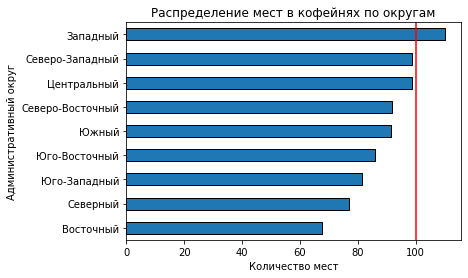

In [83]:
ax = food_df.pivot_table(index='district_short', values='seats', aggfunc='mean') \
                .sort_values(by='seats') \
                .plot(kind='barh', edgecolor = "black") 
ax.set_ylabel('Административный округ')
ax.set_xlabel('Количество мест')
ax.set_title('Распределение мест в кофейнях по округам')
ax.get_legend().remove()
ax.axvline(x=100, color='r') # добавим обозначение 100 мест на график
plt.xticks(rotation=0);

### Вывод. Детализирование исследования.

Всего кофеен по нашим данным: 1373
Доля кофеен: 16.9 %

По количеству кофеен лидируют Центральный, Северный и Северо-Восточный округа. По доле лидер Северный округ.

По удалению кофеен от центра самое неравномерное распределение в Центральном округе - кофейни жмутся к третьему километру от центра. По остальным округам распределение более равномерное.

Мы располагаем данными о 58 круглосуточных кофейнях, 25 из которых - это 43% -  находятся в Центральном округе.

Полученные данные подтверждают гипотезу о том, что круглосуточный режим работы - сомнительное преимущество для кофейни (меньше 5% с таким режимом работы). Также желательно посетить их и посмотреть на меню, возможно, там есть алкогольные напитки и/или кальян и, значит, это не совсем кофейни.

Средняя стоимость чашки капучино - 173 руб.

Западный округ - самый дорогой. Притом, что рейтинг у него самый низкий. Центральный лишь на втором месте.

3 из 9 округов имеют среднюю стоимость чашки капучино значение больше среднего по городу:
* Западный округ
* Центральный округ
* Юго-Западный округ

Самый дорогой кофе - 375 руб. за чашку - у заведения с рейтингом 4.3. У заведений с высокими рейтингами (4.6 и 4.8) стоимость 300 руб.

Максимальная стоимость чашки у заведений с топовым рейтингом - 245 руб.

Максимальная стоимость чашки в Центральном округе - 328 руб (рейтинг заведения 4.3).
<br>Максимальная стоимость чашки у топовых заведений Центрального округа - 160 руб.

Максимальная стоимость чашки в Западном округе - 300 руб (рейтинг заведения 4.2).
<br>Максимальная стоимость чашки у топового заведения (рейтинг 4.8) Западного округа - 270 руб.

Мы увидели, что максимальная стоимость чашки капучино значительно выше, чем в топовых заведениях. Это говорит о том, что полностью удовлетворить клентов при высокой стоимости чашки невозможно - требования начинают расти вместе с ростом стоимости.

Максимальная стоимость чашки капучино для заведений с высоким рейтингом (4.8 и 4.6) составляет 300 руб. Видимо, это та отметка, которую клиенты готовы платить и оставаться на высоком уровне удовлетворенности.

**Рекомендации.**

"Круто и доступно" - наш девиз.

**Круто.**

Начнем с крутости - крутым заведение будет при большом траффике. Отзывы, фото в соцсетях, события в лентах новостей - без траффика тут не обойтись. Наивысшая проходимость - значит Центральный округ. 

Мы выяснили, что располагаем детальной информацией о 53.7% существующих заведений (сверившись с Росстатом) - поэтому не можем опираться на карту с детальными данными - это всего лишь чуть больше половины всех заведений. Предлагается рассмотривать точки внутри Садового кольца - мы будем иметь максимальный траффик и не доходим до зоны максимальной плотности кофеен в Центральном округе - удаления в 3 км от центра (радиус Садового кольца не превышает 1.5 км). Внимание надо обратить на улицы с высоким траффиком - Тверскую, улицы Садового кольца, район Цветного бульвара.

Следствие топового расположения - высокая аренда, очень вероятен договор не с фиксированной ставкой, а с минималкой и концессионными отчислениями, что полностью исключает понятие "дешево". Но "дешево" редко бывает круто, так что такой вариант нам подходит.

**Доступно.**

Кофейни не относятся к типу заведений с экстремальными ценами, потратить несколько сотен рублей может практически каждый, особенно если это круто, престижно, модно. Поэтому мы остаемся в категории "доступно" даже если будем придерживаться верхнего уровня относительно категории заведения цен.

Для поддержания "крутости" необходим рейтинг. Но и забыть про условия аренды мы тоже не можем - экономика. 

Мы имеем:
* необходимость получения высокого рейтинга ограничивает нас сверху по ценам
* условия аренды в топовых местах давят на нашу ценовую политику снизу, толкая цены вверх.

Мы выяснили точку схождения этих двух встречнонаправленных векторов: максимальная стоимость чашки капучино у заведений с высоким рейтингом составляет 300 руб. - это наш ориентир.

При этом не надо стремиться к получению максимального рейтинга, он напрямую связан с относительно невысокими ценами, наш ориентир для Центрального округа - 4.7 и выше.

Среднее количество мест в кофейне Центрального округа - чуть меньше 100. Значит, это тоже наш ориентир - 100 и более гостей.

Итак, мы сформировали образ нашей кофейни:
<br>Крутое, престижное, модное заведение с ценой чашки капучино 300 руб., готовое принять 100 и более гостей, рейтингом 4.7 и выше и расположением внутри Садового кольца.

Каждое решение дизайн-проекта должно содержать в себе "круто", "престижно" или "модно", при этом избегая концепции "богато" - эти 4 термина практически невозможно совместить все одновременно. Не забываем о гармонии.

Все элементы, не только дизайн, но и формат обслуживания, внешний вид персонала должны соответствовать нашим трем китам.